Analyze SNR using matched filters

In [1]:
import sys
from pathlib import Path
import os
import warnings
import time
import re
SPIKECOUNTER_PATH = os.getenv("SPIKECOUNTER_PATH")
ANAYLSIS_OUTPUT_ROOTDIR = os.getenv("ANALYSIS_OUTPUT_ROOTDIR")
DATA_ROOTDIR = os.getenv("DATA_ROOTDIR")
sys.path.append(SPIKECOUNTER_PATH)
import matplotlib as mpl
from matplotlib import patches, colors
import colorcet as cc
from cycler import cycler

import numpy as np
import skimage.io as skio
from scipy import ndimage, signal, stats, fft, interpolate, optimize
from scipy.special import ndtr
from skimage import exposure, measure, filters, transform, morphology, draw
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from statannotations.Annotator import Annotator

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.utils.extmath import randomized_svd
import mat73
import pandas as pd
import parse
import pickle

from spikecounter.analysis import traces, images
from spikecounter.analysis import stats as sstats
from spikecounter.ui import visualize, HyperStackViewer
from spikecounter import utils

warnings.filterwarnings("once")
plt.style.use(
    os.path.join(os.getenv("SPIKECOUNTER_PATH"), "config", "bio_publications.mplstyle")
)
ss = StandardScaler()

In [2]:
expt_name = "20230323_simultaneous_calcium_voltage"
rootdir = Path(DATA_ROOTDIR, expt_name)
output_datadir = Path(os.getenv("ANALYSIS_OUTPUT_ROOTDIR"), "2022 First Heartbeat_Submitted", 
                       "Figures/Data/Figure3/", expt_name)

In [3]:
expt_info = pd.read_csv(Path(output_datadir, "experiment_data.csv"))

Generate library of matched filters

In [4]:
def generate_spike_waveforms(props, sta, radius=3):
    kernels_v = np.empty((props.shape[0], sta.shape[0]), dtype=np.float64)
    kernels_ca = np.empty((props.shape[0], sta.shape[0]), dtype=np.float64)
    roi_masks = np.empty((props.shape[0], *sta.shape[2:]), dtype=bool)
    for idx in range(props.shape[0]):
        r, c = props.loc[idx, ["centroid-0", "centroid-1"]]
        roi_mask = np.zeros_like(labels, dtype=bool)
        candidate_roi = draw.disk((r,c), radius, shape=roi_mask.shape)
        roi_mask[candidate_roi]= True
        kernel_v = images.extract_mask_trace(sta[:,1], roi_mask)
        kernel_ca = images.extract_mask_trace(sta[:,0], roi_mask)
        kernels_v[idx] = kernel_v
        kernels_ca[idx] = kernel_ca
        roi_masks[idx] = roi_mask
    return kernels_v, kernels_ca, roi_masks

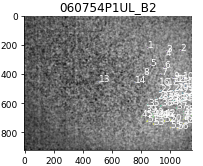

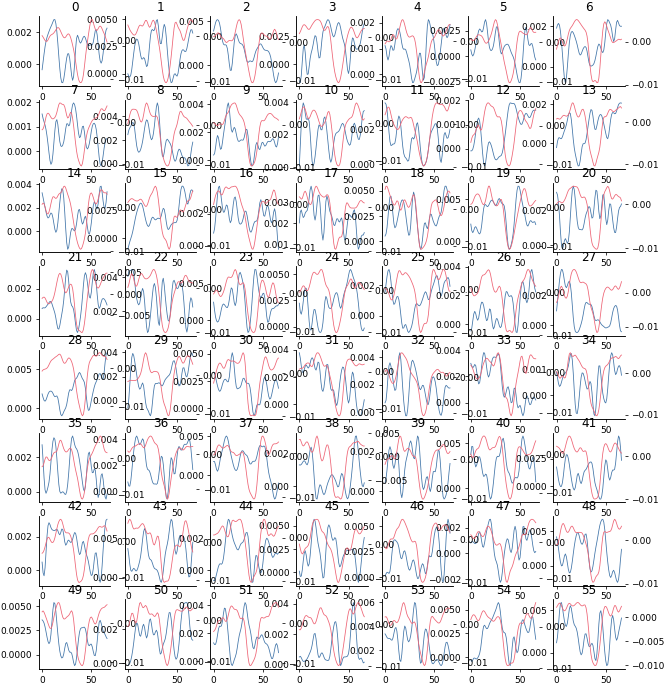

/tmp/ipykernel_265728/1652844923.py:36: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/060754P1UL_B2/060754P1UL_B2_kernels.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_kernels.tif", np.array([kernels_ca, kernels_v]))
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/060754P1UL_B2/060754P1UL_B2_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/060754P1UL_B2/060754P1UL_B2_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2

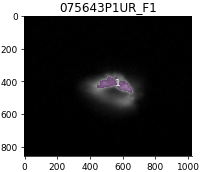

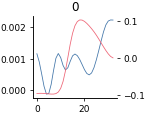

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/075643P1UR_F1/075643P1UR_F1_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/075643P1UR_F1/075643P1UR_F1_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_svd solver. If you wa

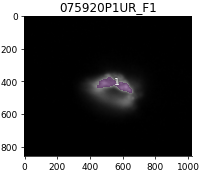

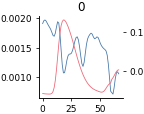

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/075920P1UR_F1/075920P1UR_F1_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/075920P1UR_F1/075920P1UR_F1_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_svd solver. If you wa

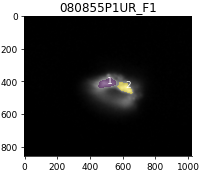

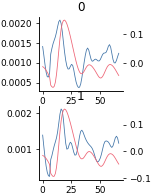

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/080855P1UR_F1/080855P1UR_F1_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/080855P1UR_F1/080855P1UR_F1_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_svd solver. If you wa

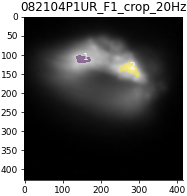

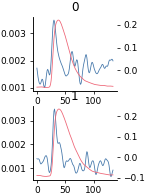

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/082104P1UR_F1_crop_20Hz/082104P1UR_F1_crop_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/082104P1UR_F1_crop_20Hz/082104P1UR_F1_crop_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature

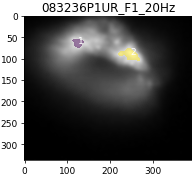

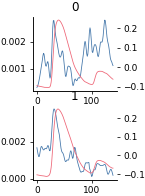

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/083236P1UR_F1_20Hz/083236P1UR_F1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/083236P1UR_F1_20Hz/083236P1UR_F1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:11: RuntimeWarning: Mean of empty slice
  rd -= np.nanmean(rd, axis=1, keepdims=True)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. Th

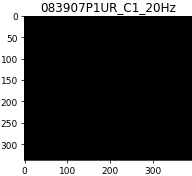

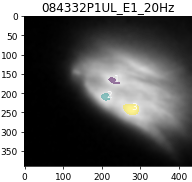

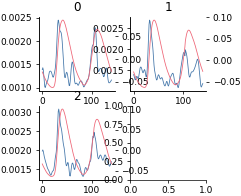

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/084332P1UL_E1_20Hz/084332P1UL_E1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/084332P1UL_E1_20Hz/084332P1UL_E1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/tifffile/tifffile.py:891: DeprecationWarning: TiffWriter: data with shape (3, 389, 434) and dtype 'uint8'' are stored as RGB with separate component planes. Future versions will store such data as MINISBLACK in separate pages by default unless the 'phot

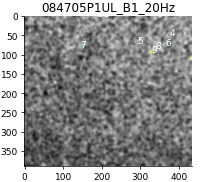

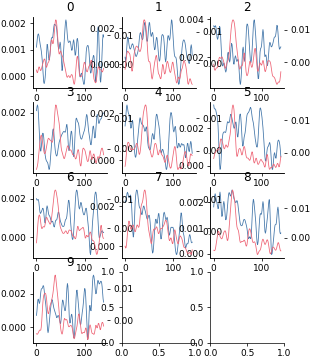

/tmp/ipykernel_265728/1652844923.py:36: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/084705P1UL_B1_20Hz/084705P1UL_B1_20Hz_kernels.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_kernels.tif", np.array([kernels_ca, kernels_v]))
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/084705P1UL_B1_20Hz/084705P1UL_B1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/084705P1UL_B1_20Hz/084705P1UL_B1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n

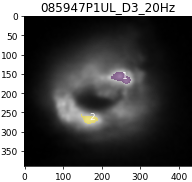

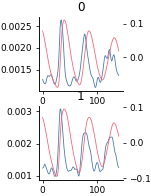

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/085947P1UL_D3_20Hz/085947P1UL_D3_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/085947P1UL_D3_20Hz/085947P1UL_D3_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

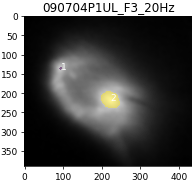

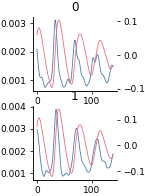

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/090704P1UL_F3_20Hz/090704P1UL_F3_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/090704P1UL_F3_20Hz/090704P1UL_F3_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

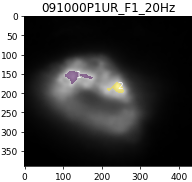

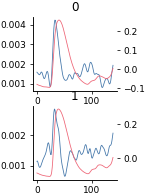

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/091000P1UR_F1_20Hz/091000P1UR_F1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/091000P1UR_F1_20Hz/091000P1UR_F1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

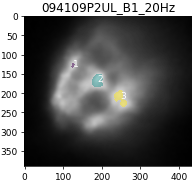

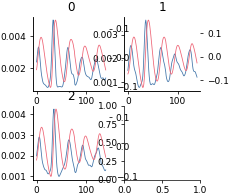

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/094109P2UL_B1_20Hz/094109P2UL_B1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/094109P2UL_B1_20Hz/094109P2UL_B1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/tifffile/tifffile.py:891: DeprecationWarning: TiffWriter: data with shape (3, 389, 434) and dtype 'uint8'' are stored as RGB with separate component planes. Future versions will store such data as MINISBLACK in separate pages by default unless the 'phot

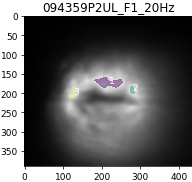

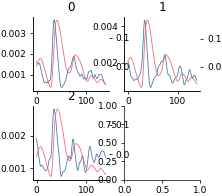

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/094359P2UL_F1_20Hz/094359P2UL_F1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/094359P2UL_F1_20Hz/094359P2UL_F1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/tifffile/tifffile.py:891: DeprecationWarning: TiffWriter: data with shape (3, 389, 434) and dtype 'uint8'' are stored as RGB with separate component planes. Future versions will store such data as MINISBLACK in separate pages by default unless the 'phot

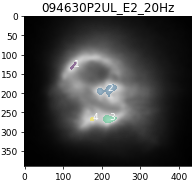

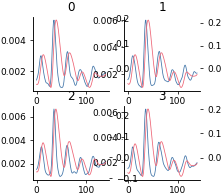

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/094630P2UL_E2_20Hz/094630P2UL_E2_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/094630P2UL_E2_20Hz/094630P2UL_E2_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/tifffile/tifffile.py:891: DeprecationWarning: TiffWriter: data with shape (4, 389, 434) and dtype 'uint8'' are stored as RGB with separate component planes. Future versions will store such data as MINISBLACK in separate pages by default unless the 'phot

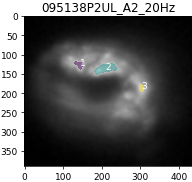

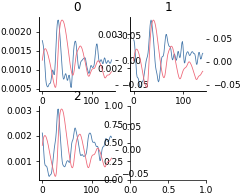

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/095138P2UL_A2_20Hz/095138P2UL_A2_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/095138P2UL_A2_20Hz/095138P2UL_A2_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/tifffile/tifffile.py:891: DeprecationWarning: TiffWriter: data with shape (3, 389, 434) and dtype 'uint8'' are stored as RGB with separate component planes. Future versions will store such data as MINISBLACK in separate pages by default unless the 'phot

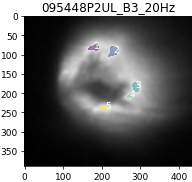

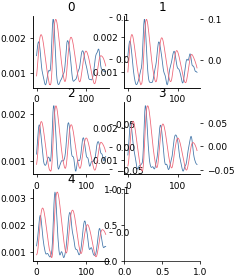

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/095448P2UL_B3_20Hz/095448P2UL_B3_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/095448P2UL_B3_20Hz/095448P2UL_B3_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

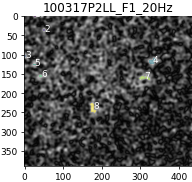

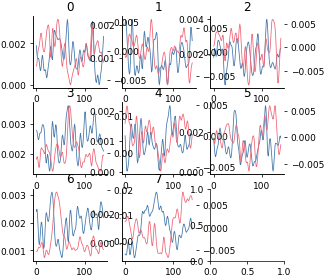

/tmp/ipykernel_265728/1652844923.py:36: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/100317P2LL_F1_20Hz/100317P2LL_F1_20Hz_kernels.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_kernels.tif", np.array([kernels_ca, kernels_v]))
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/100317P2LL_F1_20Hz/100317P2LL_F1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/100317P2LL_F1_20Hz/100317P2LL_F1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n

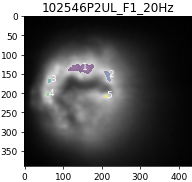

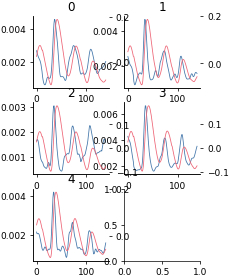

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/102546P2UL_F1_20Hz/102546P2UL_F1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/102546P2UL_F1_20Hz/102546P2UL_F1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

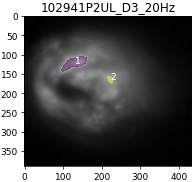

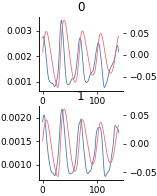

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/102941P2UL_D3_20Hz/102941P2UL_D3_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/102941P2UL_D3_20Hz/102941P2UL_D3_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

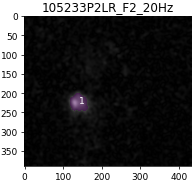

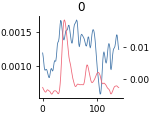

/tmp/ipykernel_265728/1652844923.py:36: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/105233P2LR_F2_20Hz/105233P2LR_F2_20Hz_kernels.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_kernels.tif", np.array([kernels_ca, kernels_v]))
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/105233P2LR_F2_20Hz/105233P2LR_F2_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/105233P2LR_F2_20Hz/105233P2LR_F2_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n

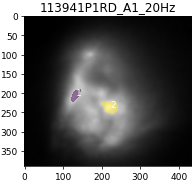

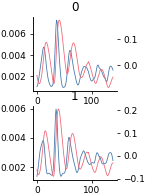

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/113941P1RD_A1_20Hz/113941P1RD_A1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/113941P1RD_A1_20Hz/113941P1RD_A1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

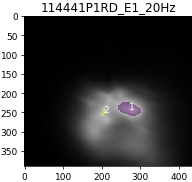

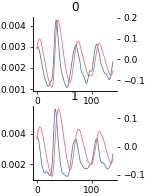

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/114441P1RD_E1_20Hz/114441P1RD_E1_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/114441P1RD_E1_20Hz/114441P1RD_E1_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

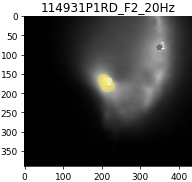

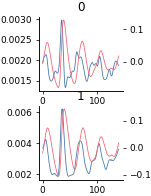

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/114931P1RD_F2_20Hz/114931P1RD_F2_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/114931P1RD_F2_20Hz/114931P1RD_F2_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/sklearn/utils/extmath.py:368: FutureWarning: If 'random_state' is not supplied, the current default is to use 0 as a fixed seed. This will change to  None in version 1.2 leading to non-deterministic results that better reflect nature of the randomized_s

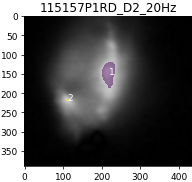

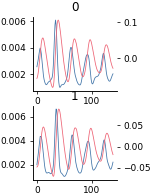

/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/115157P1RD_D2_20Hz/115157P1RD_D2_20Hz_roi_masks.tif is a boolean image: setting True to 255 and False to 0. To silence this warning, please convert the image using img_as_ubyte.
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
/tmp/ipykernel_265728/1652844923.py:37: UserWarning: /n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_calcium_voltage/analysis/115157P1RD_D2_20Hz/115157P1RD_D2_20Hz_roi_masks.tif is a low contrast image
  skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)


In [9]:
plt.close("all")
for idx, row in expt_info.iterrows():
    file_name = row.file_name
    pks_path = output_datadir/file_name/f"{file_name}_ca_peaks.pickle"
    if not pks_path.exists():
        continue
    sta = skio.imread(rootdir/"analysis"/file_name/f"{file_name}_ca_triggered_sta.tif")
    sta_ca = sta[:,0]
    sta_v = sta[:,1]
    rd = sta_ca.reshape(sta_ca.shape[0], -1).T
    rd -= np.nanmean(rd, axis=1, keepdims=True)
    rd = np.nan_to_num(rd, nan=0, posinf=0, neginf=0)
    u, s, v = randomized_svd(rd, n_components=15)
    pc1 = np.abs(u[:, 0].reshape(sta_ca.shape[1:]))
    
    matched_filter_mask = pc1 > np.nanpercentile(pc1, 99)
    d = morphology.disk(3)
    matched_filter_mask = morphology.binary_closing(morphology.binary_opening(matched_filter_mask, footprint=d), footprint=d)
    labels = measure.label(matched_filter_mask)
    fig1, ax1 = plt.subplots(figsize=(3,3))
    visualize.display_roi_overlay(pc1, labels, ax=ax1)
    ax1.set_title(file_name)
    plt.show()
    props = pd.DataFrame(measure.regionprops_table(labels, properties=('centroid', 'label')))
    if props.shape[0] == 0:
        continue
    kernels_v, kernels_ca, roi_masks = generate_spike_waveforms(props, sta, radius=3)
    fig1, axs = visualize.tile_plots_conditions(np.arange(props.shape[0]), subplot_size=(1.5, 1.5))
    for idx in range(kernels_v.shape[0]):
        ax = axs[idx]
        ax.plot(kernels_v[idx])
        ax2 = ax.twinx()
        ax2.plot(kernels_ca[idx], color="C1")
    plt.savefig(rootdir/"analysis"/file_name/f"{file_name}_kernels.svg", dpi=300, bbox_inches="tight")
    plt.show()
    skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_kernels.tif", np.array([kernels_ca, kernels_v]))
    skio.imsave(rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif", roi_masks)
    

In [8]:
plt.close("all")
all_candidate_kernels = {}
for idx, row in expt_info.iterrows():
    if row.acquisition_frequency > 10:
        file_name = row.file_name
        kernel_path = rootdir/"analysis"/file_name/f"{file_name}_kernels.tif"
        if kernel_path.exists():
            all_candidate_kernels[row.file_name] = skio.imread(kernel_path)

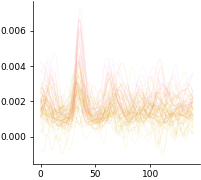

In [18]:
norm = colors.Normalize(vmin=np.min(expt_info["offset"]), vmax=np.max(expt_info["offset"]))
cmap = plt.cm.get_cmap("cet_CET_R1")
fig1, ax1 = plt.subplots(figsize=(3,3))
for idx, row in expt_info.iterrows():
    file_name = row.file_name
    if file_name in all_candidate_kernels:
        ax1.plot(all_candidate_kernels[file_name][1].T, color=cmap(norm(row.offset)), alpha=0.1)

Find lag time between spikes

In [86]:
utils.reload_libraries(traces)

/tmp/ipykernel_82132/1288481905.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, ax1 = plt.subplots(figsize=(3,3))


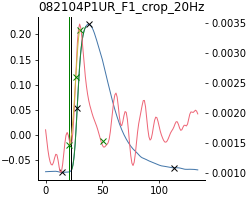

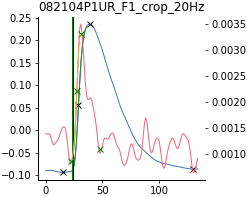

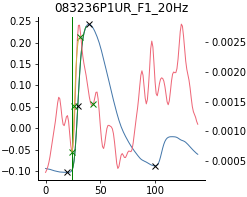

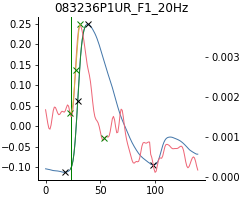

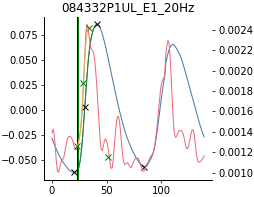

...

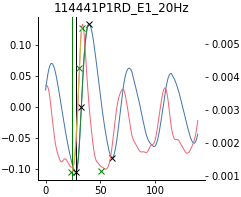

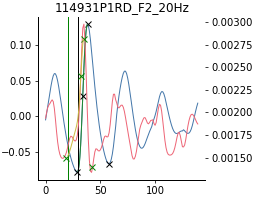

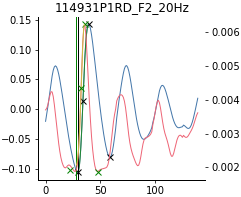

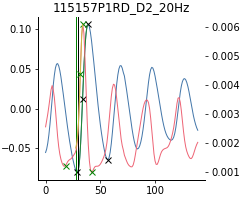

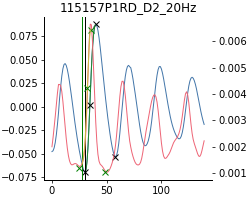

In [120]:
factor = 0.1
upsample = 100
spike_parameters = []
for idx, row in expt_info.iterrows():
    file_name = row.file_name
    fs = row.acquisition_frequency
    if file_name in ["060754P1UL_B2", "084705P1UL_B1_20Hz", "100317P2LL_F1_20Hz", "105233P2LR_F2_20Hz"]:
        continue
    if file_name in all_candidate_kernels:
#         ax1.plot(all_candidate_kernels[file_name][1].T, color=cmap(norm(row.offset)), alpha=0.1)
        ck = all_candidate_kernels[file_name]
        for j in np.arange(ck.shape[1]):
            fig1, ax1 = plt.subplots(figsize=(3,3))
            ax2 = ax1.twinx()
            ax1.plot(ck[0,j])
            ax2.plot(ck[1,j], color="C1")
            ax1.set_title(file_name)
            res_ca = traces.find_peak_bases(ck[0,j], upsample=upsample, full_output=True, s = 1e-8)
            res_v = traces.find_peak_bases(ck[1,j], upsample=upsample, full_output= True, s = 1e-8, ref_maxloc=res_ca[2])
            spl_ca = res_ca[-1]
            spl_v = res_v[-1]

            d_ca = spl_ca.derivative()
            d2_ca = spl_ca.derivative(n=2)
            d_v = spl_v.derivative()
            d2_v = spl_v.derivative(n=2)

            x_upsample = np.arange(ck.shape[-1], step = 1/upsample)
            d_ca = d_ca(x_upsample)
            d_v = d_v(x_upsample)

            dcadt_max = x_upsample[np.argmax(d_ca*(x_upsample>= res_ca[0])*(x_upsample < res_ca[2]))]
            dvdt_max = x_upsample[np.argmax(d_v*(x_upsample>= res_v[0])*(x_upsample < res_v[2]))]

            upstroke_ca = x_upsample[np.argwhere(d_ca > np.max(d_ca)*factor).ravel()]
            upstroke_v = x_upsample[np.argwhere(d_v > np.max(d_v)*factor).ravel()]
            upstroke_ca = upstroke_ca[(upstroke_ca > res_ca[0])&(upstroke_ca < res_ca[1])]
            upstroke_v = upstroke_v[(upstroke_v > res_v[0])&(upstroke_v < res_v[1])]
            ax1.plot(res_ca[:3], res_ca[-1](res_ca[:3]), "kx")
            ax2.plot(res_v[:3], res_v[-1](res_v[:3]), "gx")
            ax1.plot(upstroke_ca, spl_ca(upstroke_ca), color="C2")
            ax2.plot(upstroke_v, spl_v(upstroke_v), color="C3")
            ax1.axvline(upstroke_ca[0], color="k")
            ax1.axvline(upstroke_v[0], color="g")

            ax1.plot(dcadt_max, spl_ca(dcadt_max), "kx")
            ax2.plot(dvdt_max, spl_v(dvdt_max), "gx")
            ca_width = signal.peak_widths(ck[0,j], [np.argmax(ck[0,j])])[0][0]
            v_width = signal.peak_widths(ck[1,j], [np.argmax(ck[1,j])])[0][0]
            
            ca_params = np.array(res_ca[:3] + (dcadt_max, upstroke_ca[0], ca_width))/fs*1000
            v_params = np.array(res_v[:3] + (dvdt_max, upstroke_v[0], v_width))/fs*1000
            diff_params = ca_params - v_params
            spike_parameters.append((file_name,row.embryo,row.offset) + tuple(ca_params) + tuple(v_params) + tuple(diff_params))

In [111]:
spike_df = pd.DataFrame(spike_parameters, columns=["file_name", "embryo", "offset", "b1_ca", "b2_ca", "pk_ca", "max_dcadt", "upstroke_v",
                                                   "fwhm_ca", "b1_ca", "b2_v", "pk_v", "max_dvdt", "upstroke_v", "fwhm_v",
                                                   "b1_diff", "b2_diff", "pk_diff", "max_vel_diff", "upstroke_diff",
                                                  "fwhm_diff"])

In [113]:
spike_df.to_csv(output_datadir/"spike_waveforms.csv", index=False)

In [4]:
spike_df = pd.read_csv(output_datadir/"spike_waveforms.csv")

In [5]:
np.nanpercentile(spike_df["max_vel_diff"], [25,50,75])

array([ 76.5206,  97.5   , 131.5   ])

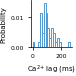

In [6]:
fig1, ax1 = plt.subplots(figsize=(1.25, 1.25))
ax1.hist(spike_df["max_vel_diff"], density=True, bins=20, facecolor="white", edgecolor="#539AD3")
ax1.set_ylabel("Probability")
ax1.set_xlabel(r"$\mathrm{Ca^{2{+}}}$ lag (ms)")
plt.tight_layout()
plt.savefig(output_datadir/"upstroke_lag.svg", dpi=300, bbox_inches="tight")

Now consider the correlations against several sample kernels

In [11]:
def generate_kernel(kv_init, n_pad=100, ratio = 0.5, plot=False, upsample=1):
    b1, b2, pk, spl = traces.find_peak_bases(kv_init, upsample=upsample, full_output=True, s = 1e-9)
    upsample_x = np.arange(b1, b2, step=1/upsample)
    
    kv_syn = spl(upsample_x)
    kv_syn = np.pad(kv_syn, (int(n_pad*ratio*upsample), int(n_pad*(1-ratio)*upsample)), constant_values=np.min(kv_syn))
    kv_syn -= np.mean(kv_syn)
    kv_syn /= np.std(kv_syn)
    if plot:
        fig1, ax1 = plt.subplots(figsize=(3,3))
        ax1.plot(kv_init)
        ax2 = ax1.twinx()
        ax2.plot(np.arange(kv_syn.shape[0])/upsample, kv_syn, color="C2")
    return kv_syn

In [12]:
kernel_filename = "094630P2UL_E2_20Hz"
kernel_idx = 0
kv_init = all_candidate_kernels[kernel_filename][1,kernel_idx]

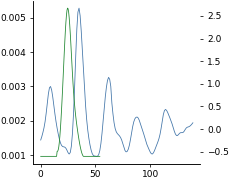

In [13]:
time_upsample = 2
kv_syn = generate_kernel(kv_init, plot=True, n_pad= 30, upsample=time_upsample)
kv_syn_norm = kv_syn/np.sqrt(np.sum(kv_syn**2))


In [14]:
bad_list = ["060754P1UL_B2", "084705P1UL_B1_20Hz", "100317P2LL_F1_20Hz", "105233P2LR_F2_20Hz"]

9.734254842791763
No peaks in file 060754P1UL_B2
(1171, 77, 96)
(56, 920, 1151)


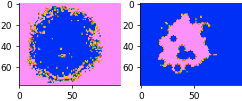

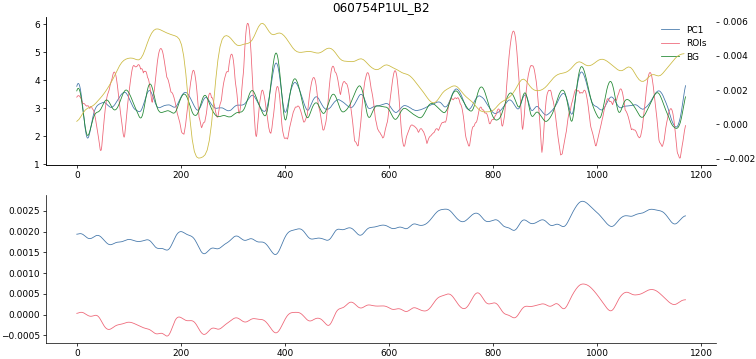

[ 972  709  200  307 1105  427  768  524  895  100]
9.734254842791763
No peaks in file 061739P1UL_E2
(1171, 77, 96)


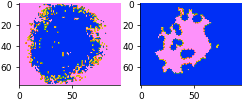

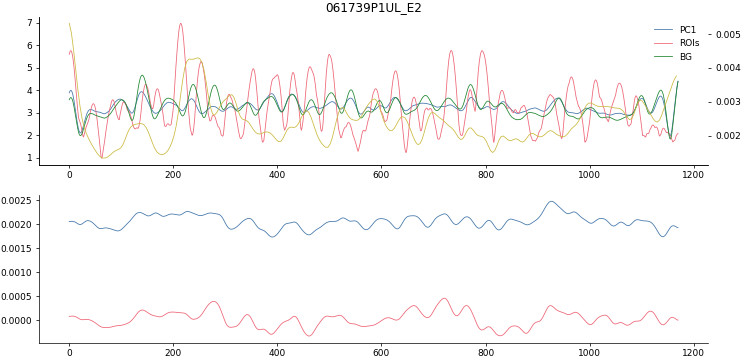

[927 227 721 432 526 661 345 599 807 764]
9.734254842791763
No peaks in file 062619P1UL_A3
(1171, 72, 86)


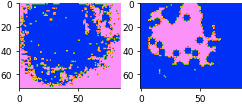

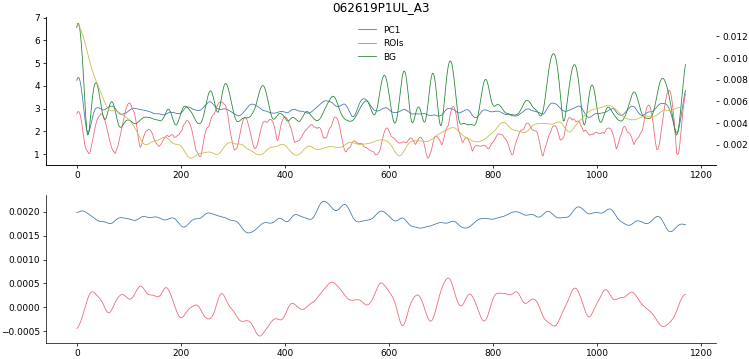

[ 475  964  253  586 1117  129  723  906  515  843]
9.734254842791763
No peaks in file 063813P1UL_E1
(1171, 72, 86)


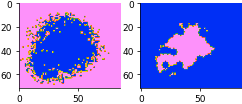

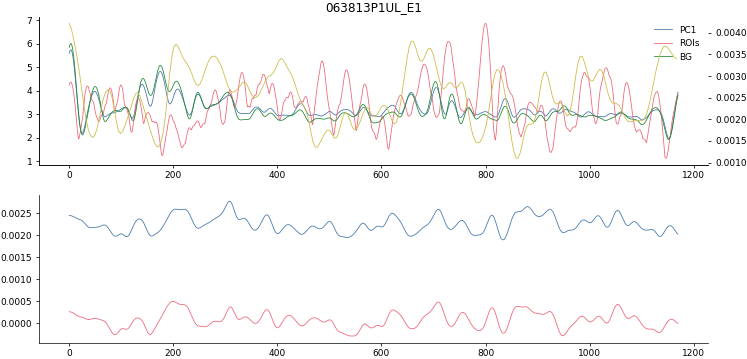

[ 308  881  709  621 1054  812  204  135  380  500]
9.734254842791763
No peaks in file 064326P1UL_A1
(1171, 72, 86)


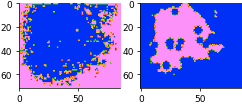

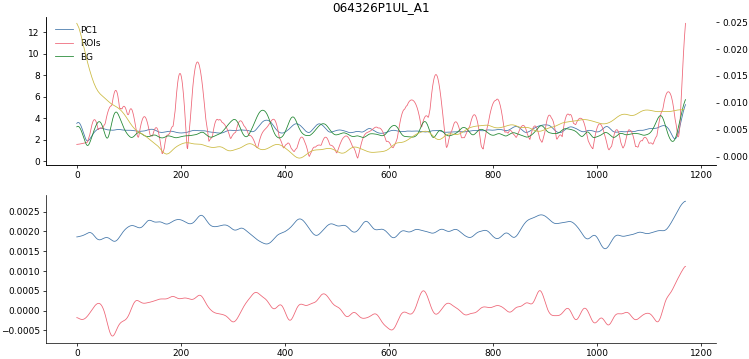

[893 239 429 556 702 489 785  25 826 195]
9.734254842791763
No peaks in file 065302P1UL_D1
(1171, 72, 86)


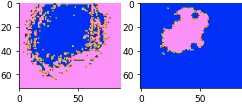

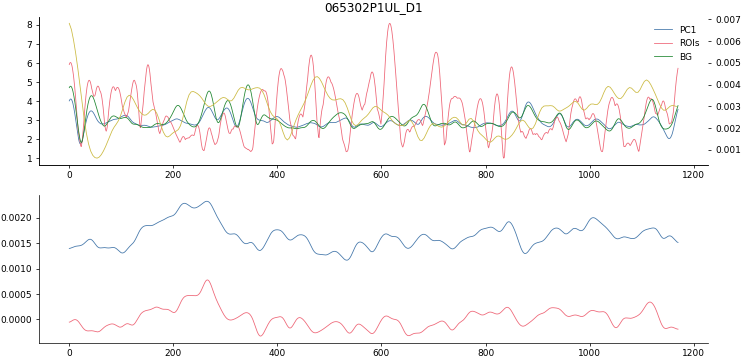

[ 264  845 1007  399  609  681 1122  559   40  936]
9.734254842791763
No peaks in file 065654P1UR_C1
(1171, 72, 86)


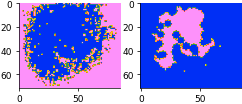

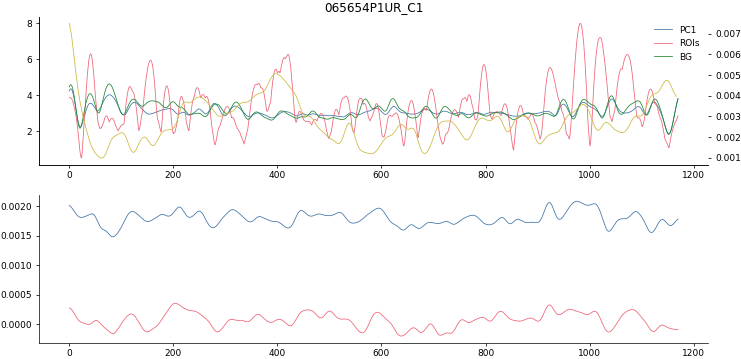

[ 976  211  594 1089  314  923  446  121  775  832]
9.734254842791763
No peaks in file 073257P1UL_B2
(1171, 72, 86)


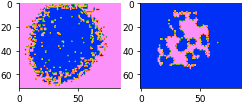

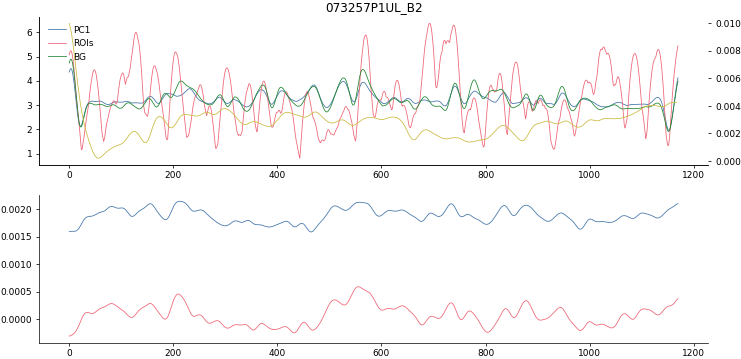

[212 557 878 734 156 836  81 945 639 417]
9.734254842791763
No peaks in file 073638P1UL_E2
(1171, 72, 86)


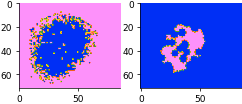

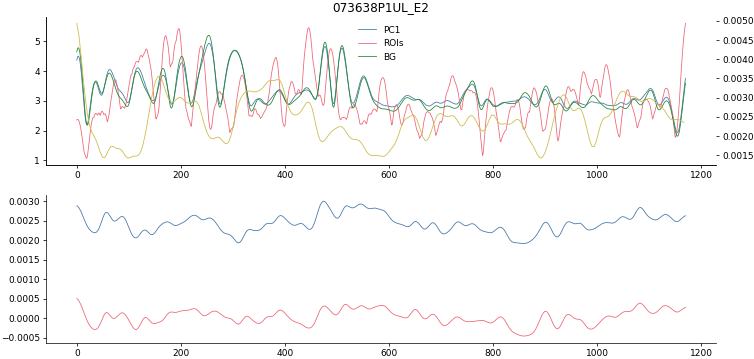

[ 474  226   57  901  546 1083  392  733  946  685]
9.734254842791763
No peaks in file 074142P1UL_D1
(1171, 72, 86)


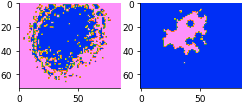

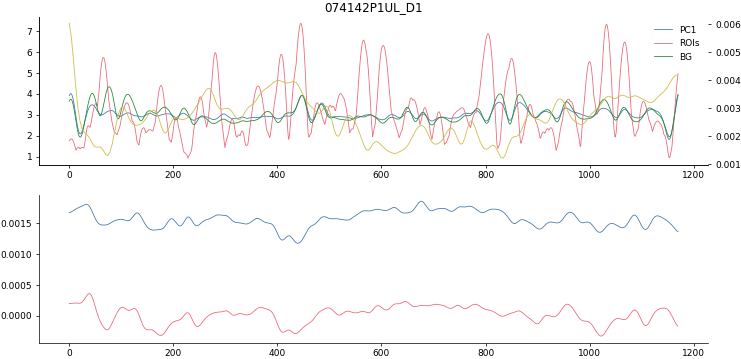

[ 677  963 1086  287 1130  130  229   33  197  361]
9.734254842791763
No peaks in file 074907P1UR_C1
(1171, 72, 86)


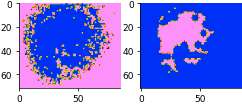

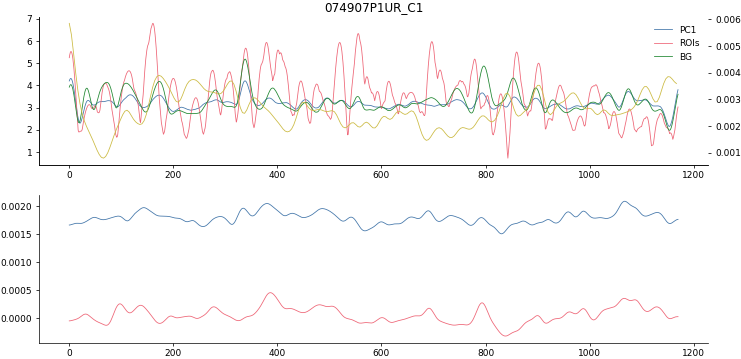

[ 380 1068  690  143  486  290  792  334  989  733]
9.734254842791763
(1171, 72, 86)
(1, 856, 1024)


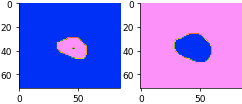

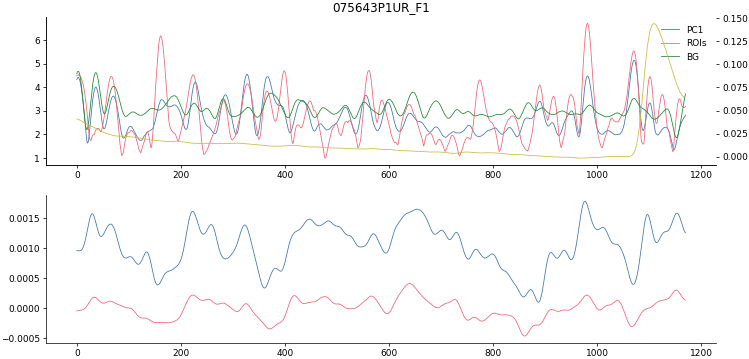

[1114]
9.73425484279168
(2371, 72, 86)
(1, 856, 1024)


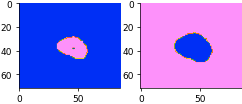

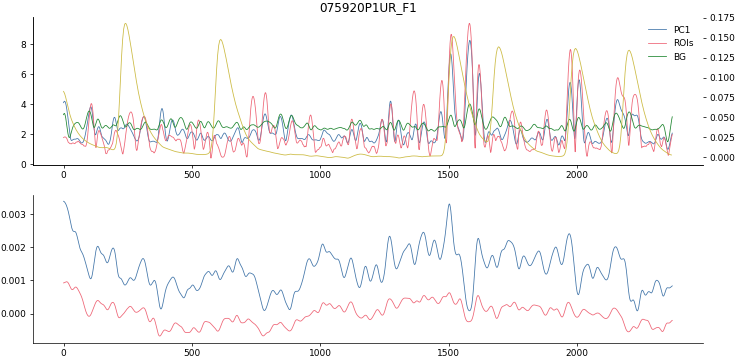

[ 242  616 1520 1697 1997 2203]
9.73425484279168
(2371, 72, 86)
(2, 856, 1024)


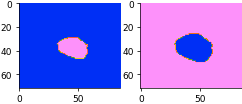

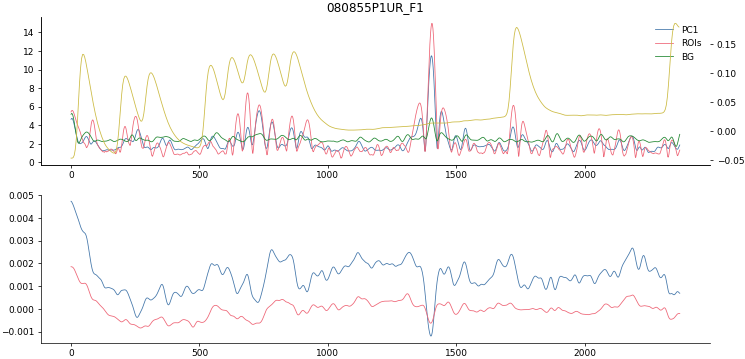

[  49  214  312  547  699  871 1738]
19.46661475569452
(2384, 36, 35)
(2, 428, 415)


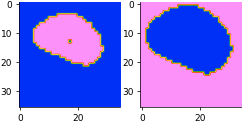

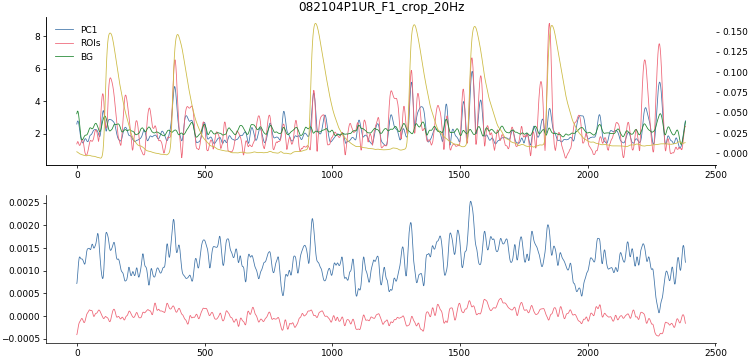

[ 132  395  935 1321 1558 1862]
19.999999999999893
(2384, 29, 33)
(2, 337, 392)


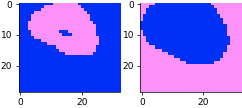

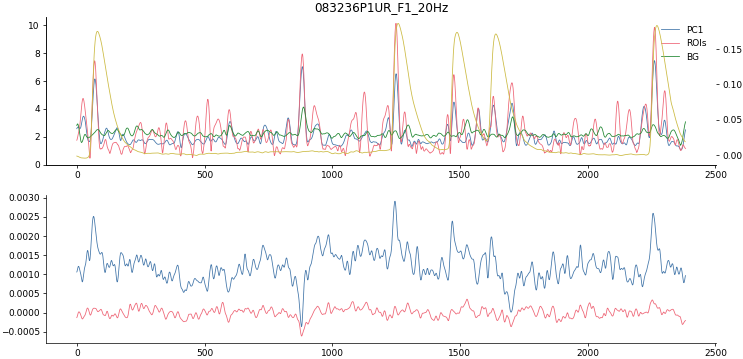

[  82 1258 1488 1642 2272]
19.999999999999893
(2384, 29, 33)


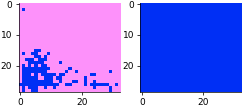

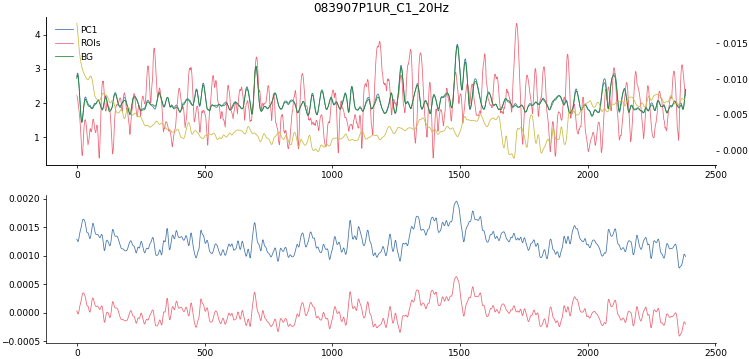

[1782]
19.999999999999893
(2384, 33, 37)
(389, 434, 3)


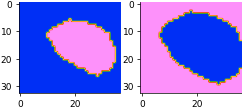

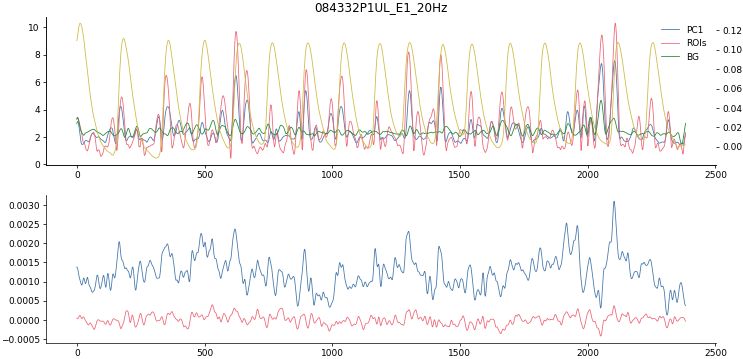

[ 184  360  502  636  766  906 1046 1186 1304 1434 1548 1698 1832 1970
 2120 2256]
19.999999999999893
No peaks in file 084705P1UL_B1_20Hz
(2384, 33, 37)
(10, 389, 434)


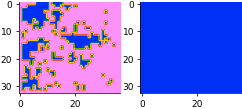

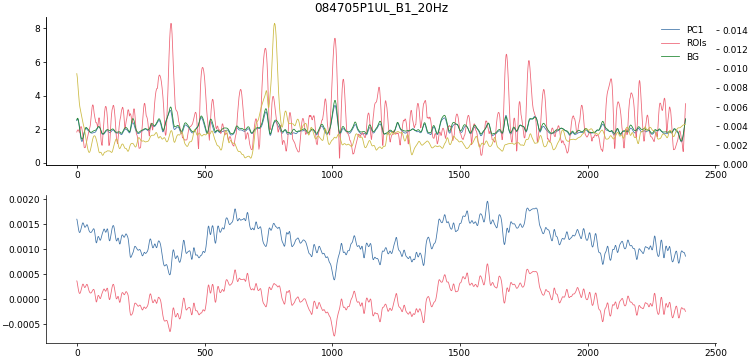

[ 620 1608 1798 1086 1251 2262  771 2158  419  288]
19.999999999999893
No peaks in file 085046P1UL_A1_20Hz
(2384, 33, 37)


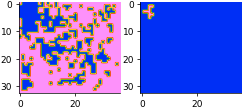

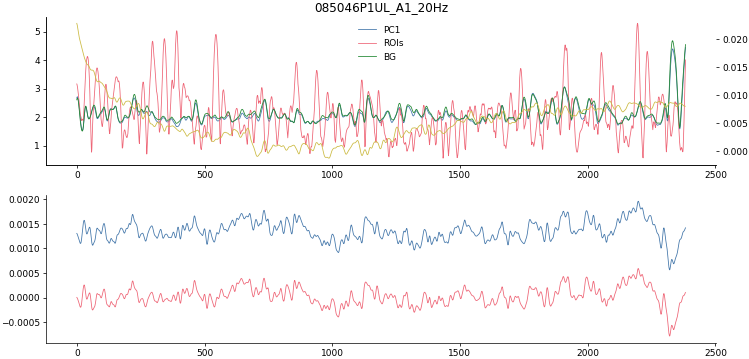

[2198  733 1131 1996  219  461 1519   29 1905 1774]
19.999999999999893
No peaks in file 085521P1UL_B2_20Hz
(2384, 33, 37)


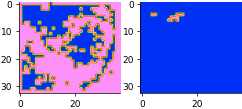

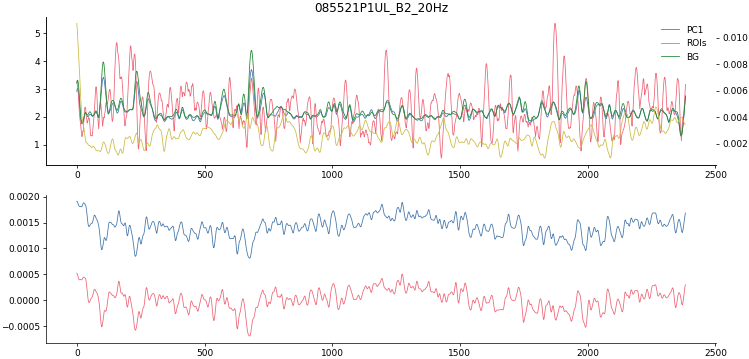

[1274  273  165 1962  570 1004 2079  650 1690 2264]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


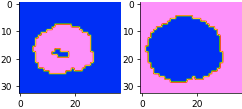

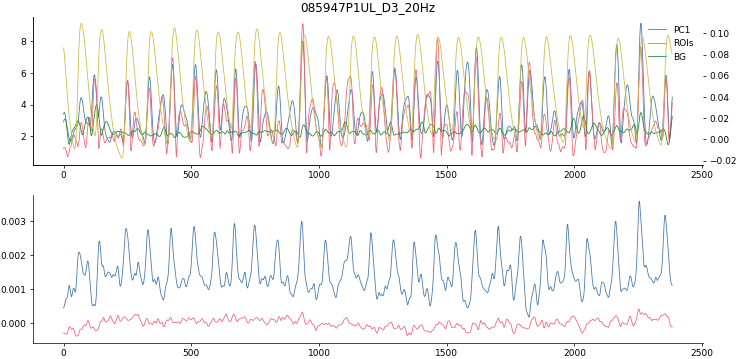

[  70  150  258  344  436  522  606  684  758  848  944 1038 1136 1218
 1306 1386 1468 1548 1624 1714 1802 1892 1986 2062 2172 2268]
19.999999999999893
No peaks in file 090305P1UL_A3_20Hz
(2384, 33, 37)


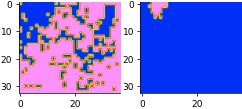

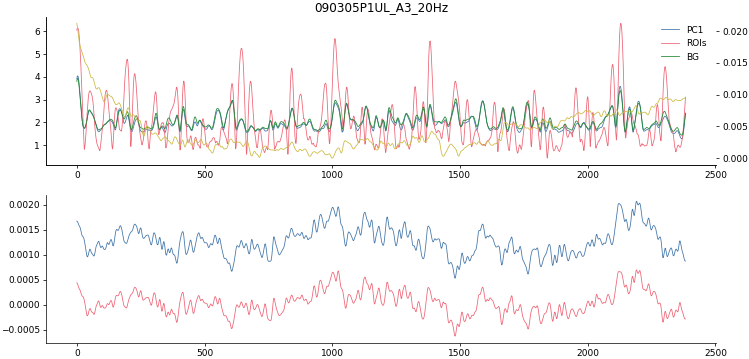

[1023 2191 1589 1128 1376  227  415 1215 1702 2122]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


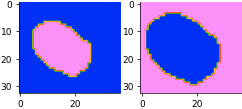

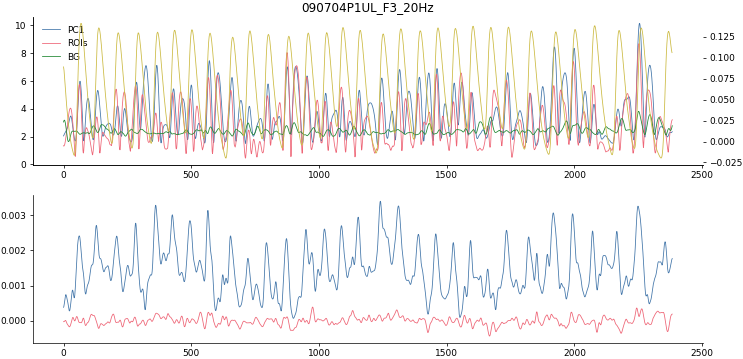

[  70  140  216  294  370  436  504  574  664  730  802  882  958 1032
 1094 1162 1252 1322 1398 1466 1536 1604 1674 1742 1832 1928 2004 2080
 2176 2262]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


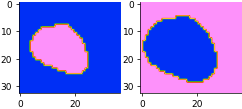

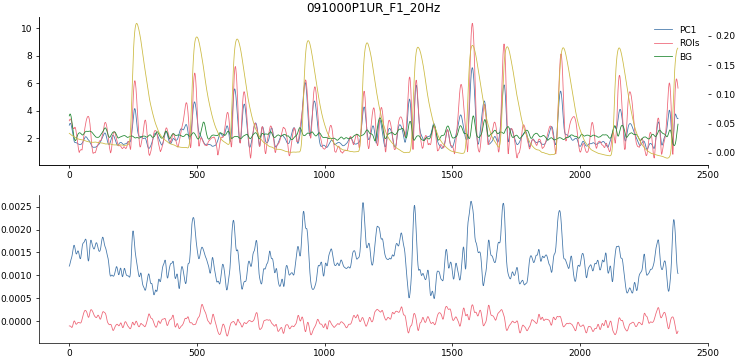

[ 264  500  658  936 1166 1366 1580 1716 1934 2154]
19.999999999999893
(2384, 33, 37)
(389, 434, 3)


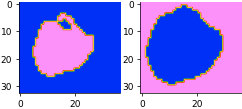

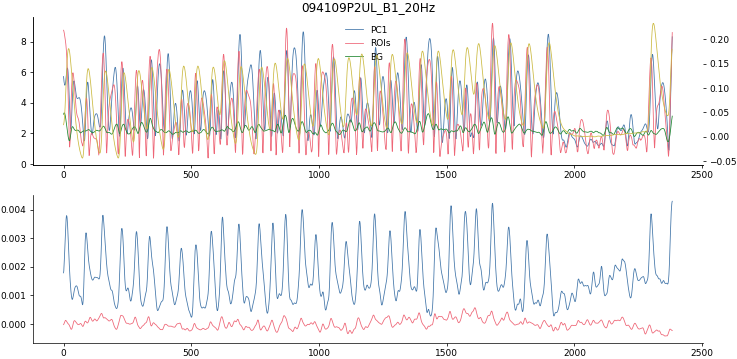

[  20   98  166  238  296  346  414  472  526  588  630  696  776  830
  878  944  998 1062 1118 1168 1228 1288 1346 1406 1468 1526 1582 1626
 1690 1752 1824 1902 2310]
19.999999999999893
(2384, 33, 37)
(389, 434, 3)


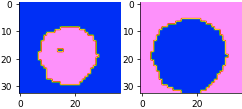

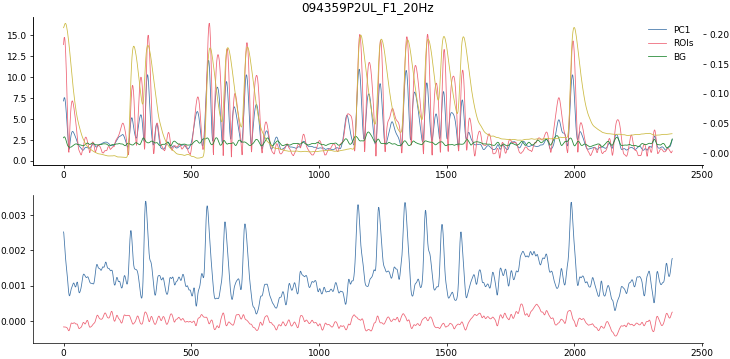

[ 276  332  574  644  722 1164 1246 1348 1428 1490 1566 2000]
19.999999999999893
(2384, 33, 37)
(389, 434, 4)


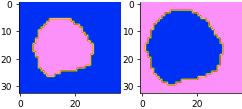

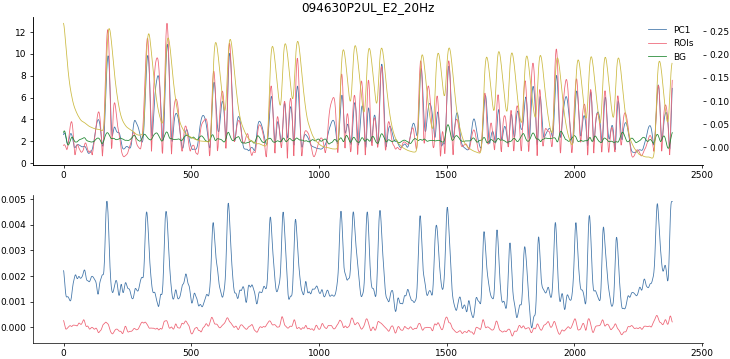

[ 180  334  410  596  654  818  868  918 1096 1142 1198 1246 1406 1468
 1510 1658 1706 1756 1814 1868 1934 2016 2066 2122 2174 2334]
nan
19.999999999999893
(2384, 33, 37)
(389, 434, 3)


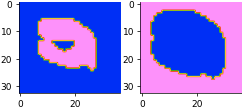

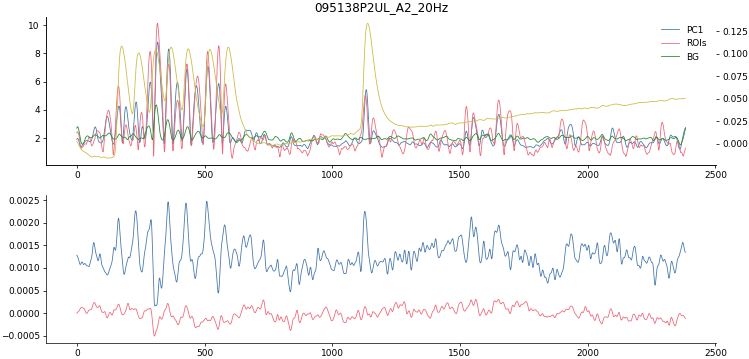

[ 176  242  310  370  436  522  594 1140]
19.999999999999893
(2384, 33, 37)
(5, 389, 434)


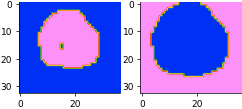

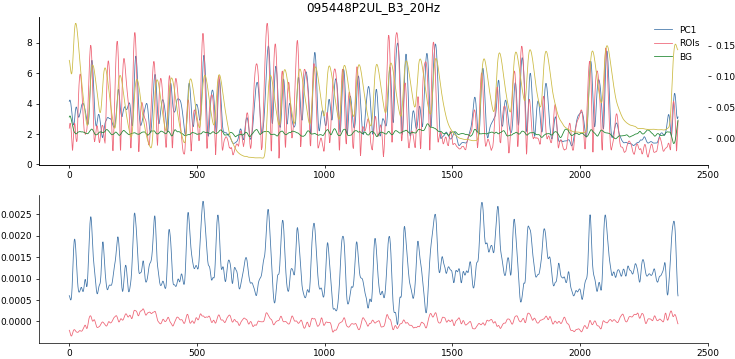

[  26   92  140  200  266  344  402  476  532  588  788  844  904  964
 1018 1078 1136 1204 1260 1320 1374 1436 1624 1684 1750 1804 1868 2048
 2106]
19.999999999999893
No peaks in file 095720P2UL_E3_20Hz
(2384, 33, 37)


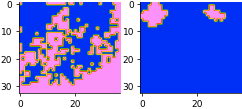

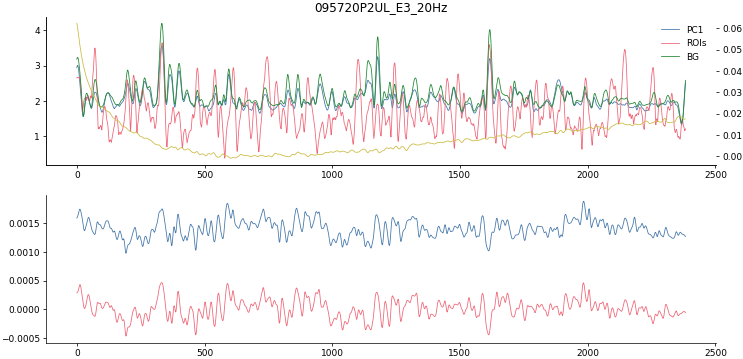

[ 590  334 1984  860 1173  396 1589 1237  554  502]
19.999999999999893
No peaks in file 100100P2LL_C1_20Hz
(2384, 33, 37)


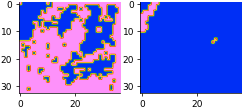

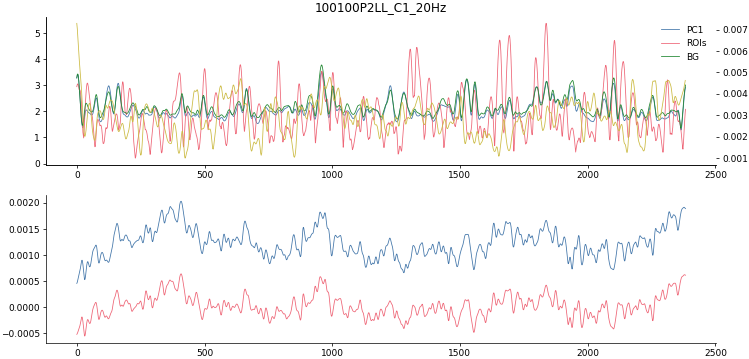

[ 408  953 1837 1531 1965  658 1226 1680 2073 1418]
19.999999999999893
No peaks in file 100317P2LL_F1_20Hz
(2384, 33, 37)
(8, 389, 434)


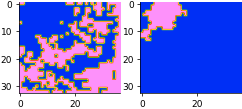

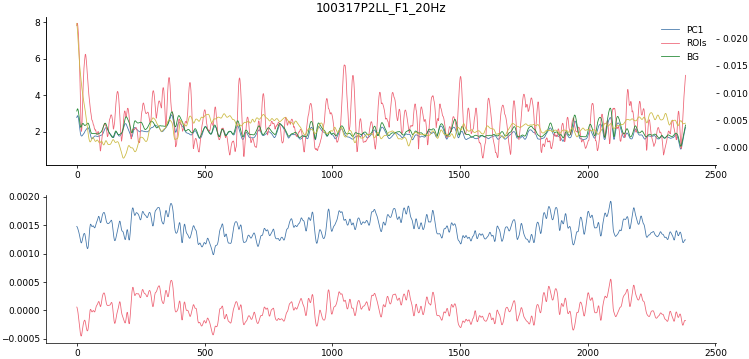

[ 369 2090 1298 1848  922 2181  106  623 2002 1712]
19.999999999999893
No peaks in file 100601P2LL_F2_20Hz
(2384, 33, 37)


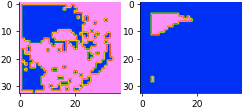

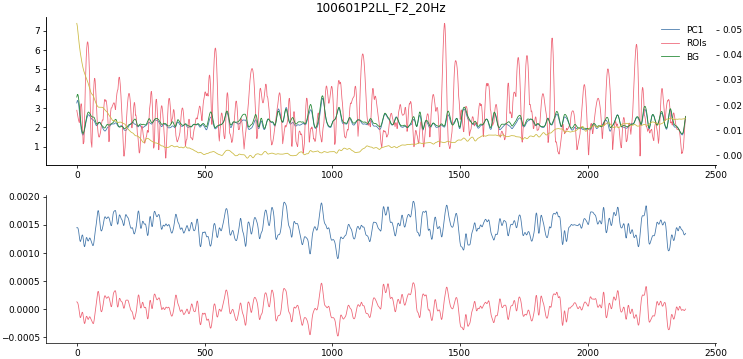

[ 958 1318  812 2229 2118  586  150 1448 1879  764]
19.999999999999893
No peaks in file 100911P2LL_A1_20Hz
(2384, 33, 37)


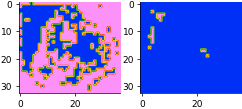

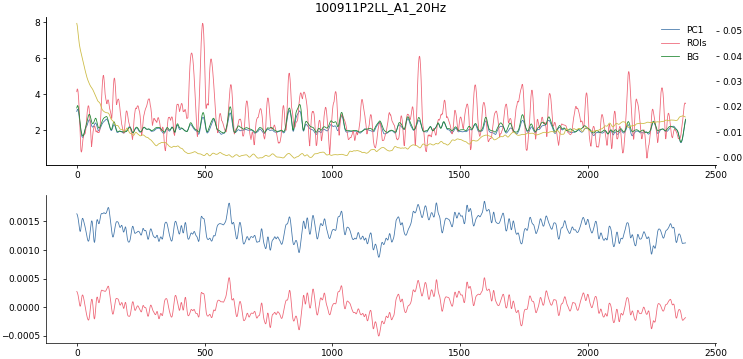

[1596 1036  596  124  833 1408 1838  489 2156  925]
19.999999999999893
(2384, 33, 37)
(5, 389, 434)


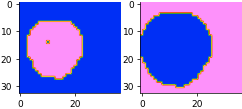

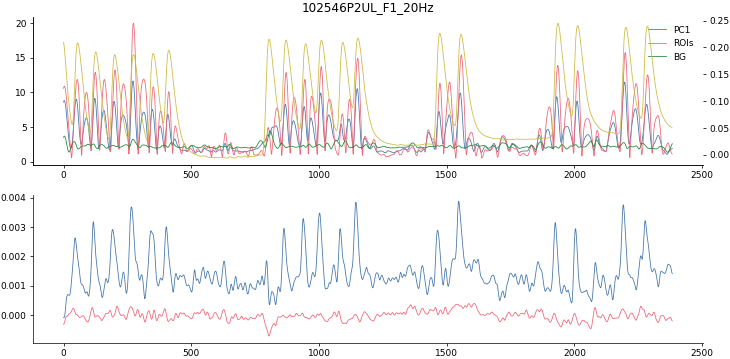

[  56  128  202  276  352  412  806  872  948 1010 1094 1154 1474 1558
 1936 2014 2202 2286]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


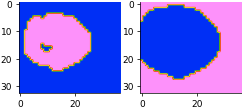

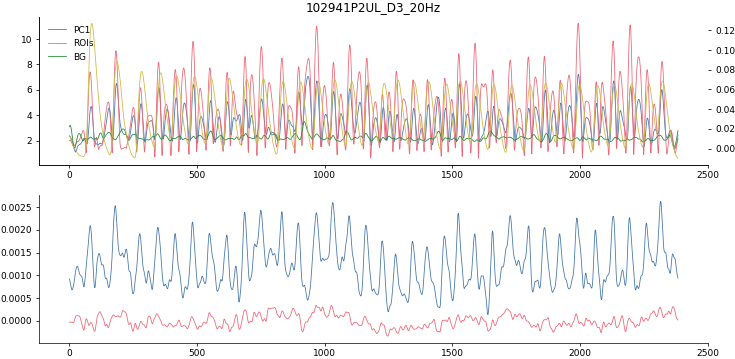

[  88  188  284  358  420  492  556  626  696  760  838  906  976 1040
 1106 1170 1234 1288 1352 1408 1478 1530 1596 1664 1734 1806 1866 1928
 1998 2070 2134 2202 2270 2324]
19.999999999999893
No peaks in file 103255P2LL_E3_20Hz_inflow
(2384, 33, 37)


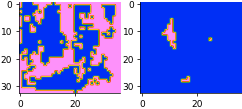

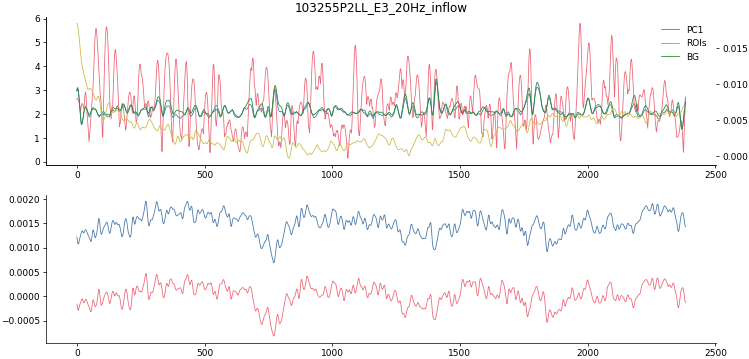

[ 902  270 1511 1801 2254  433 1999 1385  313  575]
19.999999999999893
No peaks in file 103522P2LL_E3_20Hz_mid
(2384, 33, 37)


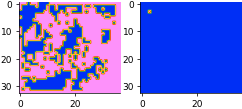

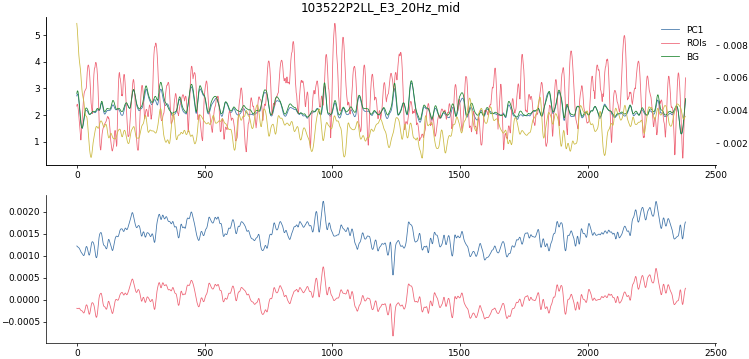

[ 965  448 1300 2268  218 1881 1508  323  553 1806]
19.999999999999893
No peaks in file 103740P2LL_D3_20Hz
(2384, 33, 37)


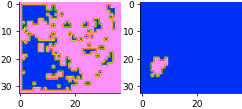

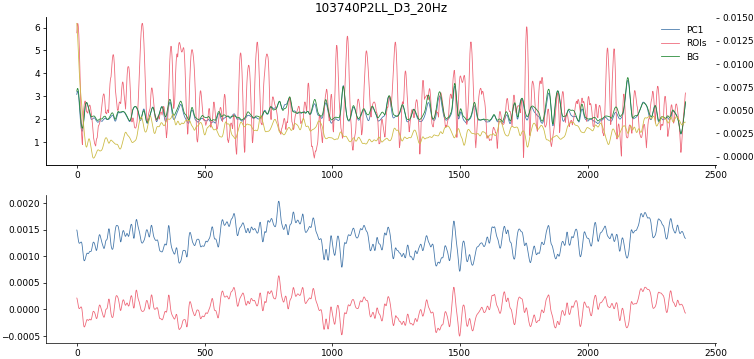

[ 791 1476  234 1124 1674 2030 1846 1732  616 1955]
19.999999999999893
No peaks in file 104316P2LL_C3_20Hz
(2384, 33, 37)


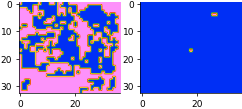

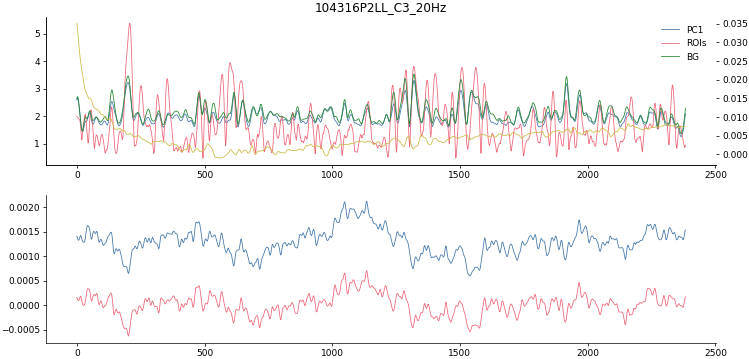

[1135  478 1967  643 1794 1376 1597 1875  909 1499]
19.999999999999893
No peaks in file 104530P2LL_B3_20Hz
(2384, 33, 37)


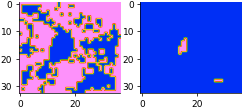

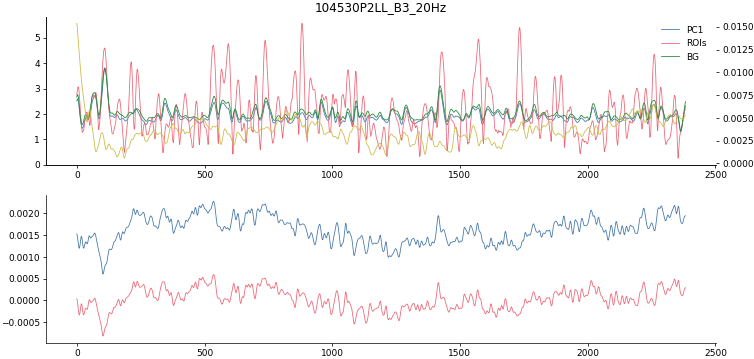

[ 535 1415 2014  737 1018  342 1053 2219 1569  614]
19.999999999999893
No peaks in file 105233P2LR_F2_20Hz
(2384, 33, 37)
(1, 389, 434)


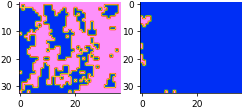

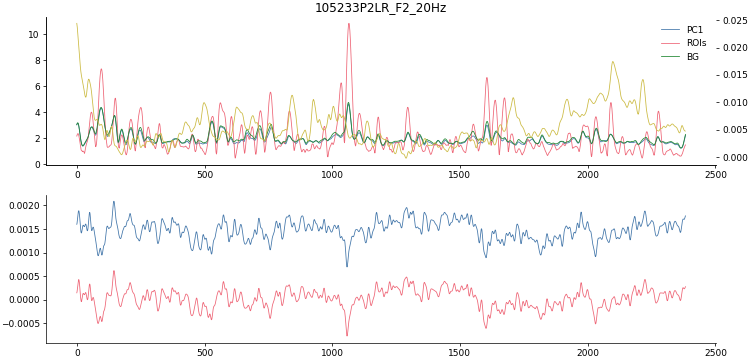

[ 145 1291 1974  574  832 1724  713  374 2224  209]
19.999999999999893
No peaks in file 105642P2LR_D3_20Hz
(2384, 33, 37)


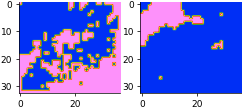

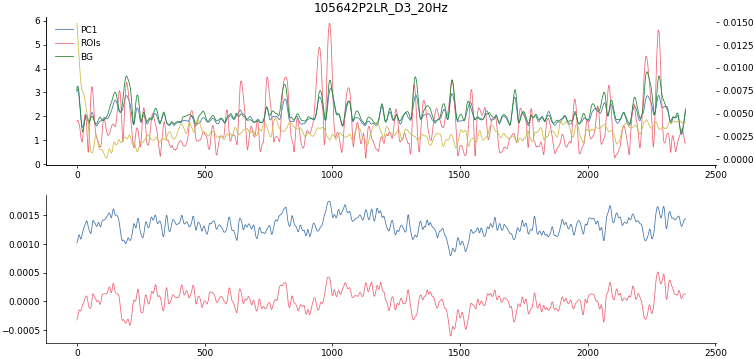

[ 988 2088  143  818  307 1792 1637 2297  352  639]
19.999999999999893
No peaks in file 105922P2LR_F3_20Hz
(2384, 33, 37)


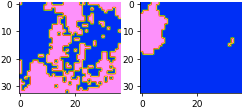

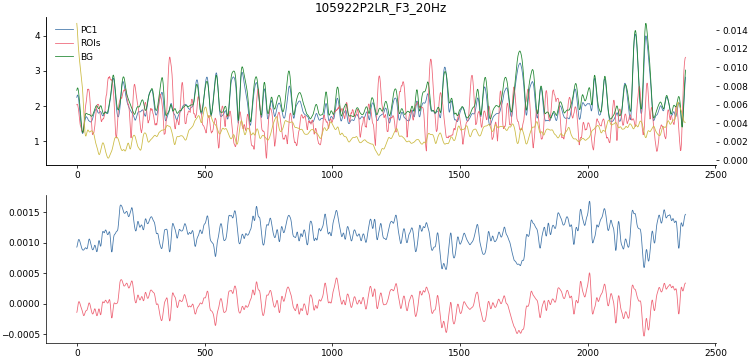

[2007  704  172 1568 2176 2300  511 1016 2065  619]
19.999999999999893
No peaks in file 112058P2LR_D1_20Hz
(2384, 33, 37)


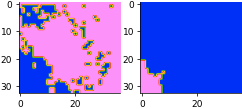

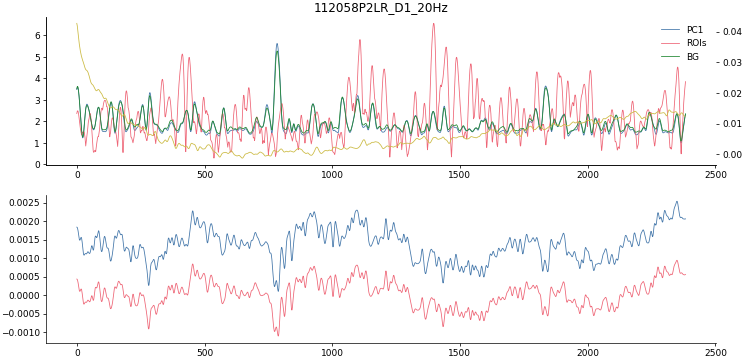

[ 454 1096 1761 1905  929  164  832 1210 1013 1388]
19.999999999999893
No peaks in file 112641P2LR_C2_20Hz
(2384, 33, 37)


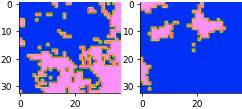

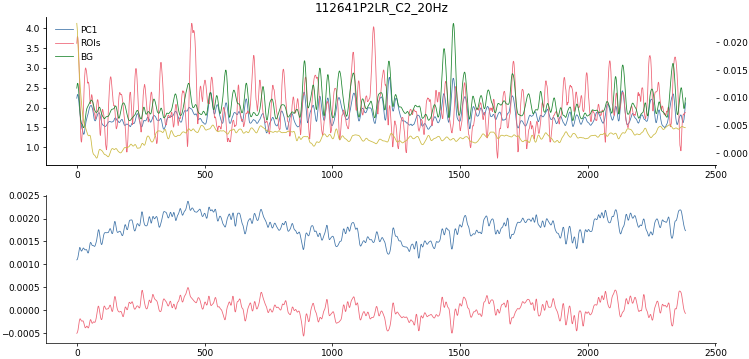

[ 435 1799 2110 1082 1239  721 1521  979 1447 2168]
19.999999999999893
No peaks in file 112954P2LR_E2_20Hz
(2384, 33, 37)


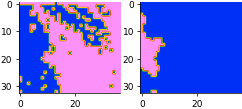

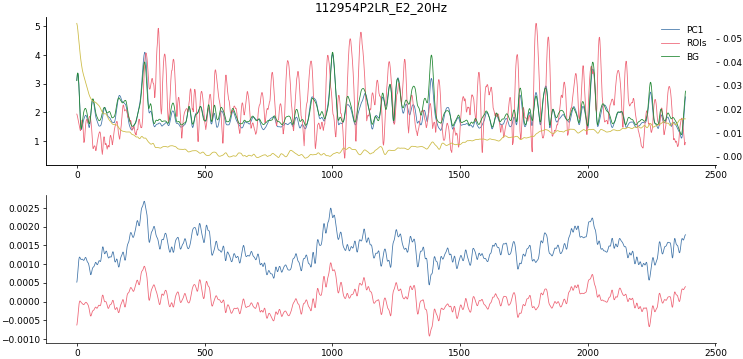

[ 264  994 2018 1251  481 1711 1833 1125 1452  102]
19.999999999999893
No peaks in file 113631P2LR_E3_20Hz
(2384, 33, 37)


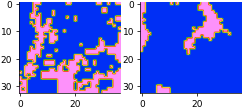

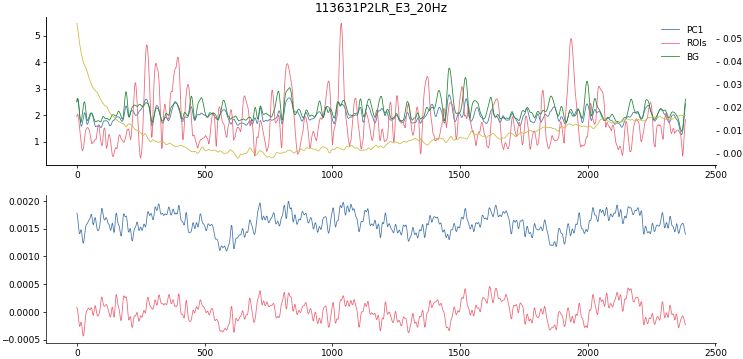

[ 829  321 1640   98 1043 2115 1208 1383  606 1521]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


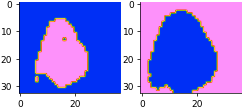

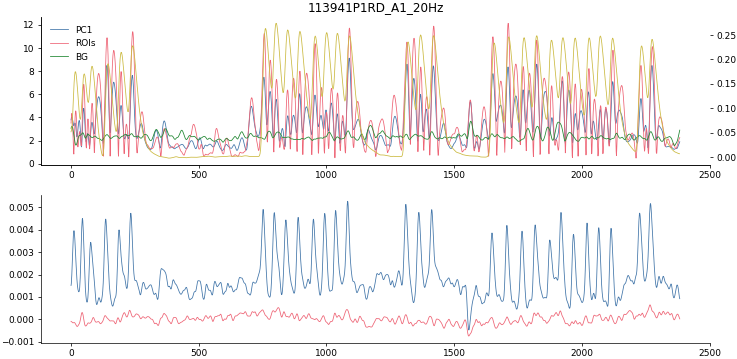

[  18   82  146  198  242  762  804  850  898  956 1002 1044 1092 1320
 1370 1420 1658 1714 1774 1824 1882 1926 1974 2030 2072 2122 2234 2276]
19.999999999999893
No peaks in file 114228P1RD_D1_20Hz
(2384, 33, 37)


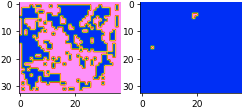

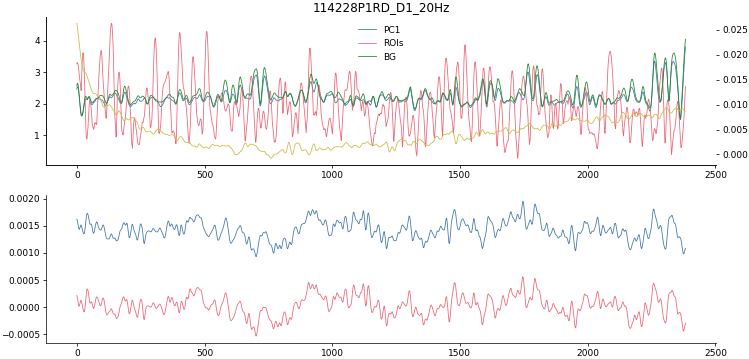

[1747 2258 1479  923 2330 2039 1302  474 1122 1447]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


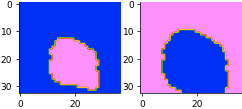

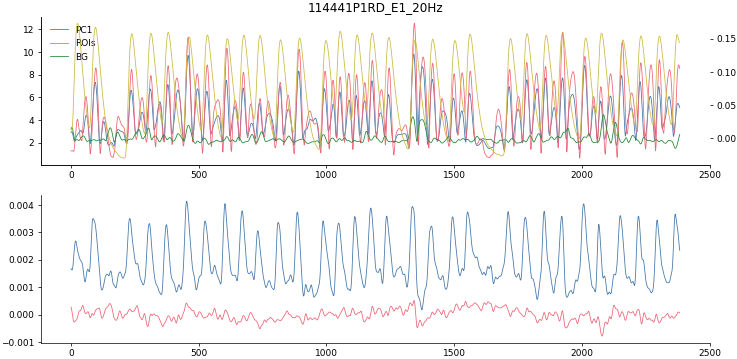

[  26   96  238  314  382  462  534  612  678  740  822  896  998 1054
 1120 1180 1244 1348 1416 1504 1562 1722 1786 1862 1924 2016 2078 2162
 2232 2304]
nan
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


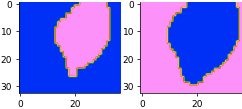

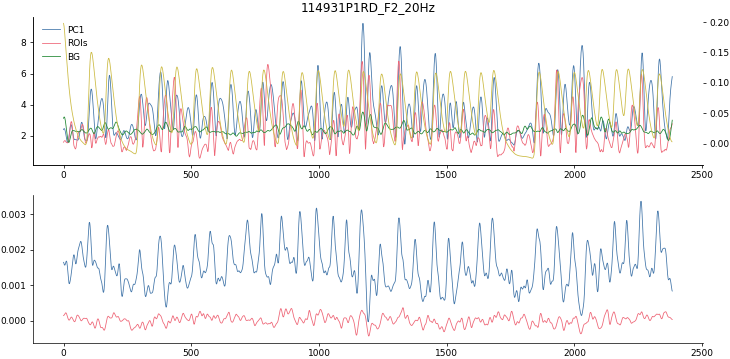

[ 110  178  306  386  444  522  584  658  728  786  862  936  998 1064
 1118 1176 1246 1320 1384 1458 1516 1574 1636 1686 1864 1938 2000 2056
 2110 2166 2212 2268 2334]
19.999999999999893
(2384, 33, 37)
(2, 389, 434)


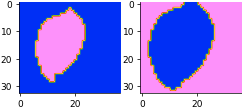

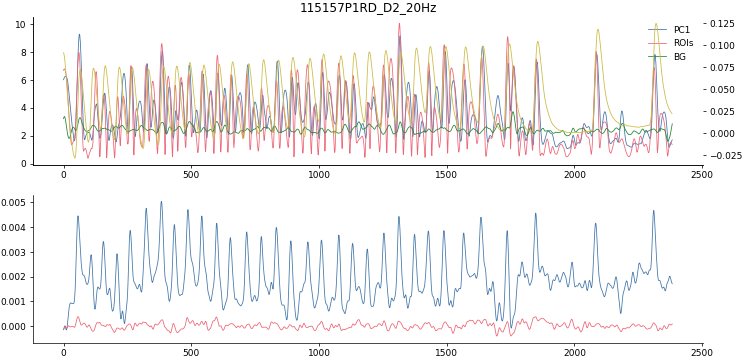

[  66  118  164  220  270  334  392  444  496  550  610  664  726  784
  842  898  966 1020 1088 1140 1198 1262 1322 1382 1436 1498 1576 1644
 1746 1858 2092 2320]


In [74]:
space_downsample = 12
pk_window = 15
all_peak_snrs = []
plt.close("all")
for idx, row in expt_info.iterrows():
#     if row.file_name not in ["084705P1UL_B1_20Hz", "082104P1UR_F1_crop_20Hz"]:
#         continue
    file_name = row.file_name
    random_peaks = False
    pks = None
    analysis_dir = rootdir/"analysis"/file_name
    fs = row.acquisition_frequency
    print(fs)
    curr_time_upsample = 20/fs*time_upsample
    pks_path = output_datadir/file_name/f"{file_name}_ca_peaks.pickle"
    if pks_path.exists() and file_name not in bad_list:
        with pks_path.open(mode="rb") as f:
            props = pickle.load(f)
        pks = np.round(props["peaks"]*curr_time_upsample).astype(int)
        
    curr_pk_window = np.round(pk_window*curr_time_upsample).astype(int)
    try:
        ca_pc1_mask = skio.imread(output_datadir/file_name/f"{file_name}_PC1_ca_mask.tif") > 0
    except FileNotFoundError:
        continue
    ca_dFF_trace = images.extract_mask_trace(skio.imread(analysis_dir/f"{file_name}_ca_dFF_smoothed.tif"), ca_pc1_mask)
    ca_pc1_mask = transform.downscale_local_mean(ca_pc1_mask, space_downsample) > 0
    v_dFF = ndimage.zoom(images.downsample_video(skio.imread(analysis_dir/f"{file_name}_v_dFF_smoothed.tif"), 
                            space_downsample), (curr_time_upsample, 1, 1))

    if pks is None:
        print(f"No peaks in file {file_name}")
        ca_pc1_mask = transform.downscale_local_mean(skio.imread(output_datadir/file_name/f"{file_name}_PC1_v_mask.tif"),
                                        space_downsample).astype(bool)
        v_dFF_trace = images.extract_mask_trace(v_dFF, ca_pc1_mask)
        pks, props = signal.find_peaks(v_dFF_trace, prominence=1e-5)
        pks = pks[np.argsort(-props["prominences"])][:min(10, len(pks))]
        random_peaks = True
    else:
        v_dFF_trace = images.extract_mask_trace(v_dFF, ca_pc1_mask)
    

    disk = morphology.disk(3)
    bg_mask = ~morphology.binary_dilation(ca_pc1_mask, footprint=disk)
    
    print(v_dFF.shape)
    vt = v_dFF.reshape(v_dFF.shape[0], -1)
    noise_mask = np.zeros(vt.shape[0])
    noise_mask[pks] = True
    noise_mask = ~np.convolve(noise_mask,
        np.ones(curr_pk_window), mode="same").astype(bool)
    vt -= vt[noise_mask].mean(axis=0, keepdims=True)
    est_var = vt[noise_mask].var(axis=0)
#     est_var = vt[:,bg_mask.ravel()].var()
    
    corr = ndimage.correlate(vt, kv_syn_norm[:,None], mode="reflect")
    snr = corr**2/est_var
    snr_img = snr.reshape(v_dFF.shape)
    
    pc1_snr = images.extract_mask_trace(snr_img**0.5, ca_pc1_mask)
    fig1, axs = plt.subplots(1,2, figsize=(4,2))
    axs[0].imshow(ca_pc1_mask)
    axs[1].imshow(bg_mask)
    if np.sum(bg_mask) < 0.25* np.prod(bg_mask.shape):
        bg_mask = np.ones_like(ca_pc1_mask)
    bg_snr = images.extract_mask_trace(snr_img**0.5, bg_mask)

    roi_path = rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif"
    roi_snrs = []
    roi_dffs = []
    if roi_path.exists():
        roi_masks = skio.imread(roi_path)
        print(roi_masks.shape)
        if roi_masks.shape[2] < roi_masks.shape[0]:
            roi_masks = np.moveaxis(roi_masks, 2, 0)
        roi_masks = transform.downscale_local_mean(roi_masks.max(axis=0), space_downsample) > 0
        props = pd.DataFrame(measure.regionprops_table(measure.label(roi_masks), properties=('centroid', 'label')))
        for j in range(props.shape[0]):
            roi_mask = np.zeros_like(roi_masks, dtype=bool)
            roi_mask[draw.disk(props.loc[j, ["centroid-0", "centroid-1"]], radius=2, shape=roi_mask.shape)] = True
            roi_snrs.append(images.extract_mask_trace(snr_img**0.5, roi_mask.astype(bool)))
            roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool)))

    else:
        v_pc1 = skio.imread(output_datadir/file_name/f"{file_name}_PC1_v.tif")
        roi_masks = v_pc1 > np.nanpercentile(v_pc1, 99)
        roi_masks = transform.downscale_local_mean(roi_masks, space_downsample) > 0
        props = pd.DataFrame(measure.regionprops_table(measure.label(roi_masks), properties=('centroid', 'label')))
        for j in range(props.shape[0]):
            roi_mask = np.zeros_like(roi_masks, dtype=bool)
            roi_mask[draw.disk(props.loc[j, ["centroid-0", "centroid-1"]], radius=2, shape=roi_mask.shape)] = True
            roi_snrs.append(images.extract_mask_trace(snr_img**0.5, roi_mask.astype(bool)))
            roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool)))

    if len(roi_snrs) == 0:
        n_voltage_pc_rois = 5
        bg_indices = np.argwhere(ca_pc1_mask)
        bg_indices = np.minimum(bg_indices, np.array(bg_mask.shape)[None,:]-3)
        bg_indices = np.maximum(bg_indices, np.ones((1,2))*3)
        np.random.shuffle(bg_indices)
        for j in range(n_voltage_pc_rois):
            roi_mask = np.zeros(snr_img.shape[1:], dtype=bool)
            roi_mask[draw.disk(bg_indices[j], radius=2, shape=roi_mask.shape)] = True
            roi_snrs.append(images.extract_mask_trace(snr_img**0.5, roi_mask.astype(bool)))
            roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool)))
            
    n_bg_rois = 10
    bg_roi_snrs = []
    bg_roi_dffs = []
    bg_indices = np.argwhere(bg_mask)
    bg_indices = np.minimum(bg_indices, np.array(bg_mask.shape)[None,:]-3)
    bg_indices = np.maximum(bg_indices, np.ones((1,2))*3)
    np.random.shuffle(bg_indices)
    for j in range(n_bg_rois):
        roi_mask = np.zeros(snr_img.shape[1:], dtype=bool)
        roi_mask[draw.disk(bg_indices[j], radius=2, shape=roi_mask.shape)] = True
        bg_roi_snrs.append(images.extract_mask_trace(snr_img**0.5, roi_mask.astype(bool)))
        bg_roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool)))

        
    fig1, axs = plt.subplots(2,1,figsize=(12,6))
    ax1 = axs[0]
    ax2 = ax1.twinx()
    ax1.plot(pc1_snr, label="PC1")
    if len(roi_snrs) > 0:
        ax1.plot(roi_snrs[0], label="ROIs")
    ax1.plot(bg_snr, label="BG", color="C2")
    ax2.plot(np.arange(len(ca_dFF_trace))*curr_time_upsample, ca_dFF_trace, color="C3")
    ax1.legend()
    ax1.set_title(file_name)
    bg_v_dFF_trace = images.extract_mask_trace(v_dFF, bg_mask)
    axs[1].plot(np.arange(len(v_dFF_trace)), v_dFF_trace)
    axs[1].plot(np.arange(len(v_dFF_trace)), bg_v_dFF_trace)

    plt.show()
    
    print(pks)
    mean_noise_snr_pc1 = pc1_snr[noise_mask].mean()
    mean_noise_snr_pc1_nomask = pc1_snr.mean()

    mean_noise_snr_bg = bg_snr[noise_mask].mean()
    mean_noise_snr_bg_nomask = bg_snr.mean()

    for pk in pks:
        left = max(pk-curr_pk_window//2, 0)
        right = min(pk+curr_pk_window//2, len(pc1_snr))
        mean_snr_pc1 = np.mean(pc1_snr[left:right])
        max_snr_pc1 = np.max(pc1_snr[left:right])

        mean_snr_bg = np.mean(bg_snr[left:right])
        max_snr_bg = np.max(bg_snr[left:right])
        entries = []
        entries.append((file_name, fs, row.embryo, row.offset, random_peaks, pk, "PC1", mean_snr_pc1, 
               max_snr_pc1, mean_noise_snr_pc1, mean_noise_snr_pc1_nomask, np.var(v_dFF_trace[50:]), stats.skew(v_dFF_trace[50:])))
        
        entries.append((file_name, fs, row.embryo, row.offset, random_peaks, pk, "BG", mean_snr_bg,
             max_snr_bg, mean_noise_snr_bg, mean_noise_snr_bg_nomask, np.var(bg_v_dFF_trace[50:]), stats.skew(bg_v_dFF_trace[50:])))
        for j, roi_snr in enumerate(roi_snrs):
            mean_noise_snr_roi = roi_snr[noise_mask].mean()
            mean_noise_snr_roi_nomask = roi_snr.mean()
            mean_snr_roi = np.mean(roi_snr[left:right])
            max_snr_roi = np.max(roi_snr[left:right])
            entries.append((file_name, fs, row.embryo, row.offset, random_peaks, pk, f"ROI", mean_snr_roi,
             max_snr_roi, mean_noise_snr_roi, mean_noise_snr_roi_nomask, np.var(roi_dffs[j][50:]), stats.skew(roi_dffs[j][50:])))
        for j, roi_snr in enumerate(bg_roi_snrs):
            mean_noise_snr_roi = roi_snr[noise_mask].mean()
            mean_noise_snr_roi_nomask = roi_snr.mean()
            mean_snr_roi = np.mean(roi_snr[left:right])
            max_snr_roi = np.max(roi_snr[left:right])
            entries.append((file_name, fs, row.embryo, row.offset, random_peaks, pk, f"BG_ROI", mean_snr_roi,
             max_snr_roi, mean_noise_snr_roi, mean_noise_snr_roi_nomask, np.var(bg_roi_dffs[j][50:]), stats.skew(bg_roi_dffs[j][50:])))
        all_peak_snrs.extend(entries)

In [19]:
len(bg_roi_snrs)

10

In [ ]:
083907P1UR_C1_20Hz

In [ ]:
q = pd.DataFrame(all_peak_snrs, columns=["file_name", "fs", "embryo", "offset",
                                "random", "pk_idx","region", "mean_snr_pk", "max_snr_pk", "mean_snr_tr_noise", "mean_snr_tr"])

<AxesSubplot:xlabel='region', ylabel='max_snr_pk'>

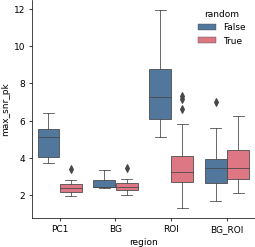

In [234]:
fig1, ax1 = plt.subplots(figsize=(4,4))
sns.boxplot(data=q, x="region", y="max_snr_pk", hue="random", ax = ax1)

<AxesSubplot:xlabel='region', ylabel='mean_snr_tr'>

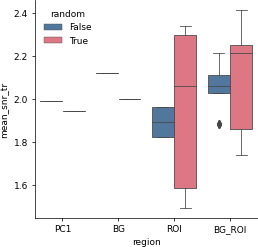

In [248]:
fig1, ax1 = plt.subplots(figsize=(4,4))
sns.boxplot(data=q, x="region", y="mean_snr_tr", hue="random", ax = ax1)

In [215]:
pks, props = signal.find_peaks(v_dFF_trace, prominence=1e-5)
pks = pks[np.argsort(-props["prominences"])][:min(10, len(pks))]

In [224]:
skio.imsave(rootdir/f"{file_name}_test_snr_img.tif", snr_img**0.5)

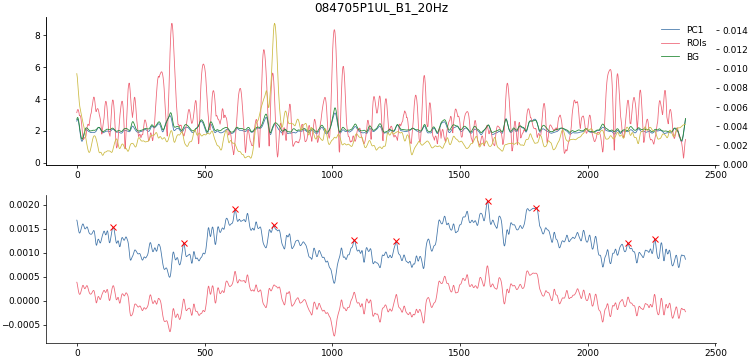

In [221]:
fig1, axs = plt.subplots(2,1,figsize=(12,6))
ax1 = axs[0]
ax2 = ax1.twinx()
ax1.plot(pc1_snr, label="PC1")
if len(roi_snrs) > 0:
    ax1.plot(roi_snrs[0], label="ROIs")
ax1.plot(bg_snr, label="BG", color="C2")
ax2.plot(np.arange(len(ca_dFF_trace))*curr_time_upsample, ca_dFF_trace, color="C3")
ax1.legend()
ax1.set_title(file_name)
axs[1].plot(np.arange(len(v_dFF_trace)), v_dFF_trace)
axs[1].plot(np.arange(len(v_dFF_trace)), images.extract_mask_trace(v_dFF, bg_mask))
axs[1].plot(pks, v_dFF_trace[pks], "rx")

plt.show()

In [102]:
snr_df = pd.read_csv(output_datadir/f"calcium_peak_voltage_snr_kernel_{kernel_filename}-{kernel_idx}_window10.csv")

In [100]:
snr_df = pd.DataFrame(all_peak_snrs, columns=["file_name", "fs", "embryo", "offset",
                                "random", "pk_idx","region", "mean_snr_pk", "max_snr_pk", "mean_snr_tr_noise", "mean_snr_tr",
                                             "dff_var", "dff_skew"])

In [98]:
snr_df["region"]

array([], dtype=object)

In [103]:
snr_df["region"].unique()

array(['PC1', 'BG', 'ROI', 'BG_ROI'], dtype=object)

In [104]:
snr_df = snr_df[snr_df["fs"] > 12]

In [105]:
snr_df["temporal_ratio"] = snr_df["max_snr_pk"]/snr_df["mean_snr_tr"]

In [78]:
# snr_df.to_csv(\
#     output_datadir/f"calcium_peak_voltage_snr_kernel_{kernel_filename}-{kernel_idx}_window10.csv", index=False)

In [19]:
snr_df["region_random"] = snr_df["region"].astype(str) + "_" + snr_df["random"].astype(str)

In [96]:
snr_df["region"].unique()

array(['PC1', 'Background'], dtype=object)

In [106]:
snr_by_x = snr_df[snr_df["region"].isin(["ROI", "BG_ROI"])].set_index(["region","random"])

<AxesSubplot:xlabel='region', ylabel='max_snr_pk'>

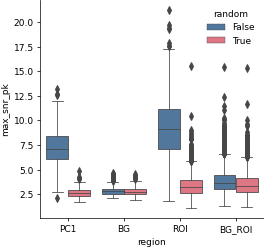

In [23]:
fig1, ax1 = plt.subplots(figsize=(4,4))
sns.boxplot(data=snr_df, x="region", y="max_snr_pk", hue="random", ax = ax1)

<AxesSubplot:xlabel='region', ylabel='max_snr_pk'>

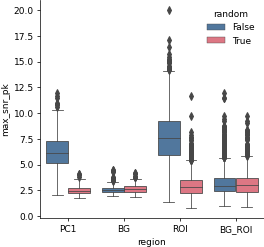

In [25]:
fig1, ax1 = plt.subplots(figsize=(4,4))
sns.boxplot(data=snr_df, x="region", y="max_snr_pk", hue="random", ax = ax1)

/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


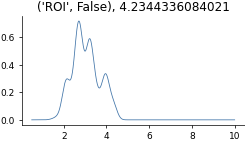

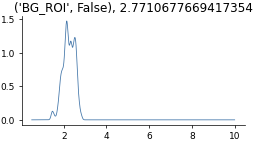

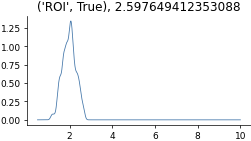

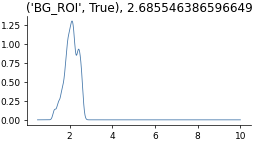

In [30]:
cutoffs = {}
for idx in snr_by_x.index.unique():
    x = np.linspace(0.5, 10, 4000)
    null = snr_by_x.loc[idx, "mean_snr_tr_noise"]
    kde = stats.gaussian_kde(null, bw_method=len(null)**(-1/5)*1)
    cdf = np.array(tuple(ndtr(np.ravel(item - kde.dataset) / kde.factor).mean()
            for item in x))
    cutoffs[idx] = x[np.argwhere(cdf>0.95).ravel()[0]]
    
    fig1, ax1 = plt.subplots(figsize=(4,2))
    ax1.plot(x, kde.pdf(x))
    ax1.set_title(f"{str(idx)}, {cutoffs[idx]}")

/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


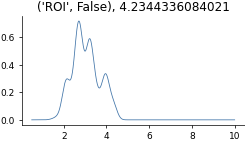

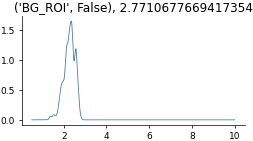

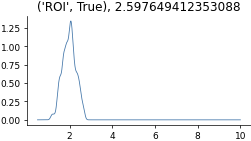

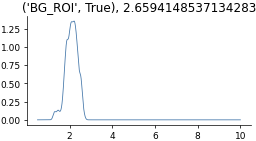

In [111]:
cutoffs = {}
for idx in snr_by_x.index.unique():
    x = np.linspace(0.5, 10, 4000)
    null = snr_by_x.loc[idx, "mean_snr_tr_noise"]
    kde = stats.gaussian_kde(null, bw_method=len(null)**(-1/5)*1)
    cdf = np.array(tuple(ndtr(np.ravel(item - kde.dataset) / kde.factor).mean()
            for item in x))
    cutoffs[idx] = x[np.argwhere(cdf>0.95).ravel()[0]]
    
    fig1, ax1 = plt.subplots(figsize=(4,2))
    ax1.plot(x, kde.pdf(x))
    ax1.set_title(f"{str(idx)}, {cutoffs[idx]}")

In [94]:
snr_by_x

,,file_name,fs,embryo,offset,pk_idx,mean_snr_pk,max_snr_pk,mean_snr_tr_noise,mean_snr_tr,dff_var,dff_skew,temporal_ratio,calcium
region,random,,,,,,,,,,,,,


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/pandas/core/indexing.py:925: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


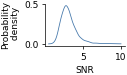

In [136]:
x = np.linspace(0.5, 10, 4000)
null = snr_by_x.loc[("BG_ROI", False), "max_snr_pk"]
kde = stats.gaussian_kde(null, bw_method=len(null)**(-1/5)*1)
cdf = np.array(tuple(ndtr(np.ravel(item - kde.dataset) / kde.factor).mean()
        for item in x))
cutoff_pk = x[np.argwhere(cdf>0.95).ravel()[0]]

fig1, ax1 = plt.subplots(figsize=(2, 1.25))
ax1.plot(x, kde.pdf(x))
ax1.set_xlabel(r"SNR")
ax1.set_ylabel("Probability\n density")
plt.tight_layout()
plt.savefig(output_datadir/"background_kde_density.svg")

In [110]:
max_snr_pks = snr_df.groupby(["region","random", "file_name", "pk_idx"]).mean()["max_snr_pk"]
calcium_roi_pks = max_snr_pks.loc[("ROI", False)]
print(np.sum(calcium_roi_pks > cutoffs[("ROI", False)]), calcium_roi_pks.shape[0])

NameError: name 'cutoffs' is not defined

In [122]:
pct_detectable = []
for idx in snr_by_x.index.unique():
    idx_df = snr_by_x.loc[idx]
    print(idx, np.sum(max_snr_pks.loc[idx]> cutoff_pk), max_snr_pks.loc[idx].shape[0])
    pct_detectable.append(idx + (100*np.sum(max_snr_pks.loc[idx]> cutoff_pk)/max_snr_pks.loc[idx].shape[0],))

pct_detectable = pd.DataFrame(pct_detectable, columns=["region", "random", "pct"])
pct_detectable["calcium"] = pct_detectable["random"].map({False: "Active",
                                          True: "Silent"})
pct_detectable["region"] = pct_detectable["region"].map({"ROI": "PC1",
                                         "BG_ROI": "Background"
                                        }, na_action="ignore")

('ROI', False) 349 377
('BG_ROI', False) 1 377
('ROI', True) 1 220
('BG_ROI', True) 1 220


/tmp/ipykernel_260338/401972741.py:3: PerformanceWarning: indexing past lexsort depth may impact performance.
  idx_df = snr_by_x.loc[idx]


In [56]:
338/377

0.896551724137931

In [41]:
361/377

0.9575596816976127

In [42]:
70/220

0.3181818181818182

In [146]:
max_snr_pks

region  random  file_name                pk_idx
BG      False   082104P1UR_F1_crop_20Hz  132       2.819506
                                         395       2.220975
                                         935       2.296239
                                         1321      2.608712
                                         1558      2.410994
                                                     ...   
ROI     True    114228P1RD_D1_20Hz       1479      2.805373
                                         1747      3.468198
                                         2039      2.471371
                                         2258      3.689500
                                         2330      3.441105
Name: max_snr_pk, Length: 2388, dtype: float64

In [125]:
pct_detectable

,region,random,pct,calcium
0,PC1,False,92.572944,Active
1,Background,False,0.265252,Active
2,PC1,True,0.454545,Silent
3,Background,True,0.454545,Silent


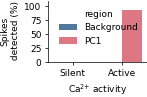

In [132]:
fig1, ax1 = plt.subplots(figsize=(2.3, 1.6))
order = ["Silent", "Active"]
hue_order = ["Background", "PC1"]
sns.barplot(data=pct_detectable, x="calcium", y="pct", hue="region", order=order, hue_order=hue_order, ax = ax1)
ax1.set_ylabel("Spikes\n detected (%)")
ax1.set_xlabel(r"$\mathrm{Ca^{2{+}}}$ activity")
ax1.set_ylim(0, 110)
ax1.set_yticks([0,25,50,75,100])
plt.tight_layout()
plt.savefig(output_datadir/"spikes_detected.svg")

In [133]:
snr_df["calcium"] = snr_df["random"].map({False: "Active",
                                          True: "Silent"})
snr_df["region"] = snr_df["region"].map({"ROI": "PC1",
                                         "BG_ROI": "Background"
                                        }, na_action="ignore")

In [134]:
snr_df = snr_df[~(snr_df["region"].isna() | snr_df["max_snr_pk"].isna())]

In [81]:
snr_df_by_x = snr_df.set_index(["calcium", "region"])
idx = snr_df_by_x.loc[("Silent", "Background")]["dff_skew"].argmax()
snr_df_by_x.loc[("Silent", "Background")].iloc[idx]

/tmp/ipykernel_260338/4127137909.py:2: PerformanceWarning: indexing past lexsort depth may impact performance.
  idx = snr_df_by_x.loc[("Silent", "Background")]["dff_skew"].argmax()


file_name            100100P2LL_C1_20Hz
fs                                 20.0
embryo                          P2LL_C1
offset                            13986
random                             True
pk_idx                              408
mean_snr_pk                    2.185094
max_snr_pk                     2.898656
mean_snr_tr_noise              1.870639
mean_snr_tr                    1.911809
dff_var                             0.0
dff_skew                       1.800897
temporal_ratio                 1.516184
Name: (Silent, Background), dtype: object

In [44]:
snr_df_by_x = snr_df.set_index(["calcium", "region"])
idx = snr_df_by_x.loc[("Silent", "Background")]["dff_skew"].argmax()
snr_df_by_x.loc[("Silent", "Background")].iloc[idx]

/tmp/ipykernel_260338/4127137909.py:2: PerformanceWarning: indexing past lexsort depth may impact performance.
  idx = snr_df_by_x.loc[("Silent", "Background")]["dff_skew"].argmax()


file_name            100100P2LL_C1_20Hz
fs                                 20.0
embryo                          P2LL_C1
offset                            13986
random                             True
pk_idx                              408
mean_snr_pk                     1.32384
max_snr_pk                     1.586676
mean_snr_tr_noise              1.914569
mean_snr_tr                    1.938905
dff_var                             0.0
dff_skew                       2.476078
temporal_ratio                 0.818336
Name: (Silent, Background), dtype: object

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Active_Background vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=2.726e+05
Silent_PC1 vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=3.164e+05


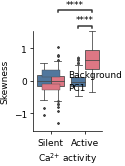

In [87]:
fig1, ax1 = plt.subplots(figsize=(1.8,2.7))
x = "calcium"
y = "dff_skew"
hue = "region"
order = ["Silent", "Active"]
hue_order = ["Background", "PC1"]
sns.boxplot(data=snr_df, x=x, y=y, 
    hue=hue,fliersize=1, order=order, hue_order=hue_order, ax=ax1)
ax1.set_xlabel(r"$\mathrm{Ca^{2{+}}}$ activity")
ax1.set_ylabel("Skewness")
ax1.get_legend().set_title("")
ax1.set_ylim(-1.55, 1.55)

pairs = [[("Active", "Background"), ("Active", "PC1")],
         [("Silent", "PC1"), ("Active", "PC1")],]
annot = Annotator(ax1, pairs, data=snr_df, 
                  x=x,y=y, hue=hue, hue_order=hue_order, order=order)
annot.configure(test="Mann-Whitney", verbose=2, loc="outside",
                comparisons_correction="BH")
annot.apply_and_annotate()
plt.tight_layout()
plt.savefig(output_datadir/"dff_skewness.svg", dpi=300, bbox_inches="tight")

In [147]:
snr_df.shape

(10408, 15)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Active_Background vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=1.730e+05
Silent_PC1 vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=1.301e+05


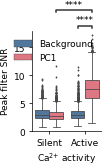

In [135]:
fig1, ax1 = plt.subplots(figsize=(1.8,2.7))
x = "calcium"
y = "max_snr_pk"
hue = "region"
order = ["Silent", "Active"]
hue_order = ["Background", "PC1"]
sns.boxplot(data=snr_df, x=x, y=y, 
    hue=hue,fliersize=1, order=order, hue_order=hue_order, ax=ax1)
ax1.set_xlabel(r"$\mathrm{Ca^{2{+}}}$ activity")
ax1.set_ylabel("Peak filter SNR")
ax1.get_legend().set_title("")
ax1.set_ylim(0, 18)

pairs = [[("Active", "Background"), ("Active", "PC1")],
         [("Silent", "PC1"), ("Active", "PC1")],]
annot = Annotator(ax1, pairs, data=snr_df, 
                  x=x,y=y, hue=hue, hue_order=hue_order, order=order)
annot.configure(test="Mann-Whitney", verbose=2, loc="outside",
                comparisons_correction="BH")
annot.apply_and_annotate()
plt.tight_layout()
plt.savefig(output_datadir/"matched_filter_snr.svg", dpi=300, bbox_inches="tight")

Check distribution of dFF for a few examples

In [58]:
ex_files = ["083236P1UR_F1_20Hz", "083907P1UR_C1_20Hz"]

In [28]:
snr_df

,file_name,fs,embryo,offset,random,pk_idx,region,mean_snr_pk,max_snr_pk,mean_snr_tr_noise,mean_snr_tr,dff_var,dff_skew,temporal_ratio,calcium
5909,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,NaN,2.741153,2.872932,2.042560,2.133966,NaN,NaN,1.346288,Active
5910,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,NaN,2.360810,2.819506,2.179431,2.179416,NaN,NaN,1.293698,Active
5911,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,PC1,4.599836,5.429119,2.114465,2.259541,3.623963e-07,-0.179289,2.402753,Active
5912,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,PC1,4.243111,6.084637,1.945395,2.230683,3.600510e-07,0.419404,2.727701,Active
5913,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,Background,1.557310,2.116990,1.876096,1.856692,2.707325e-07,0.215224,1.140195,Active
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,2.524841,2.942687,2.525878,2.504022,3.051070e-08,0.065604,1.175184,Active
17507,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,1.926532,2.325662,2.174990,2.189861,2.364662e-07,-0.188441,1.062014,Active
17508,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,2.040925,2.973430,2.244599,2.298534,4.407061e-07,0.088043,1.293620,Active
17509,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,3.495069,4.285752,2.330968,2.423867,3.116659e-07,0.235209,1.768146,Active


19.999999999999893
(2384, 29, 33)
19.999999999999893
(2384, 29, 33)


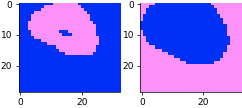

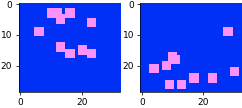

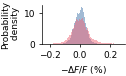

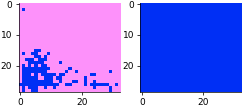

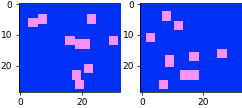

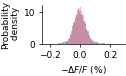

In [90]:
space_downsample = 12
pk_window = 15
all_peak_snrs = []
plt.close("all")
for idx, row in expt_info.iterrows():
    file_name = row.file_name
    if file_name not in ex_files:
        continue
    random_peaks = False
    pks = None
    analysis_dir = rootdir/"analysis"/file_name
    fs = row.acquisition_frequency
    print(fs)
    curr_time_upsample = 20/fs*time_upsample
    pks_path = output_datadir/file_name/f"{file_name}_ca_peaks.pickle"
    if pks_path.exists() and file_name not in bad_list:
        with pks_path.open(mode="rb") as f:
            props = pickle.load(f)
        pks = np.round(props["peaks"]*curr_time_upsample).astype(int)
        
    curr_pk_window = np.round(pk_window*curr_time_upsample).astype(int)
    try:
        ca_pc1_mask = skio.imread(output_datadir/file_name/f"{file_name}_PC1_ca_mask.tif") > 0
    except FileNotFoundError:
        continue
    ca_dFF_trace = images.extract_mask_trace(skio.imread(analysis_dir/f"{file_name}_ca_dFF_smoothed.tif"), ca_pc1_mask)
    ca_pc1_mask = transform.downscale_local_mean(ca_pc1_mask, space_downsample) > 0
    v_dFF = ndimage.zoom(images.downsample_video(skio.imread(analysis_dir/f"{file_name}_v_dFF_smoothed.tif"), 
                            space_downsample), (curr_time_upsample, 1, 1))

    if pks is None:
        print(f"No peaks in file {file_name}")
        ca_pc1_mask = transform.downscale_local_mean(skio.imread(output_datadir/file_name/f"{file_name}_PC1_v_mask.tif"),
                                        space_downsample).astype(bool)
        v_dFF_trace = images.extract_mask_trace(v_dFF, ca_pc1_mask)
        pks, props = signal.find_peaks(v_dFF_trace, prominence=1e-5)
        pks = pks[np.argsort(-props["prominences"])][:min(10, len(pks))]
        random_peaks = True
    else:
        v_dFF_trace = images.extract_mask_trace(v_dFF, ca_pc1_mask)
    

    disk = morphology.disk(3)
    bg_mask = ~morphology.binary_dilation(ca_pc1_mask, footprint=disk)
    
    print(v_dFF.shape)
    vt = v_dFF.reshape(v_dFF.shape[0], -1)
    noise_mask = np.zeros(vt.shape[0])
    noise_mask[pks] = True
    noise_mask = ~np.convolve(noise_mask,
        np.ones(curr_pk_window), mode="same").astype(bool)
    vt -= vt[noise_mask].mean(axis=0, keepdims=True)
    est_var = vt[noise_mask].var(axis=0)
#     est_var = vt[:,bg_mask.ravel()].var()
    
    corr = ndimage.correlate(vt, kv_syn_norm[:,None], mode="reflect")
    snr = corr**2/est_var
    snr_img = snr.reshape(v_dFF.shape)
    
    pc1_snr = images.extract_mask_trace(snr_img**0.5, ca_pc1_mask)

    if np.sum(bg_mask) < 0.25* np.prod(bg_mask.shape):
        bg_mask = np.ones_like(ca_pc1_mask)

    fig1, axs = plt.subplots(1,2, figsize=(4,2))
    axs[0].imshow(ca_pc1_mask)
    axs[1].imshow(bg_mask)
    
    roi_path = rootdir/"analysis"/file_name/f"{file_name}_roi_masks.tif"
    roi_snrs = []
    roi_dffs = []
#     if roi_path.exists():
#         roi_masks = skio.imread(roi_path)
#         print(roi_masks.shape)
#         if roi_masks.shape[2] < roi_masks.shape[0]:
#             roi_masks = np.moveaxis(roi_masks, 2, 0)
#         roi_masks = transform.downscale_local_mean(roi_masks.max(axis=0), space_downsample) > 0
#         props = pd.DataFrame(measure.regionprops_table(measure.label(roi_masks), properties=('centroid', 'label')))
#         for j in range(props.shape[0]):
#             roi_mask = np.zeros_like(roi_masks, dtype=bool)
#             roi_mask[draw.disk(props.loc[j, ["centroid-0", "centroid-1"]], radius=2, shape=roi_mask.shape)] = True
#             roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool))[50:])

#     else:
#         v_pc1 = skio.imread(output_datadir/file_name/f"{file_name}_PC1_v.tif")
#         roi_masks = v_pc1 > np.nanpercentile(v_pc1, 99)
#         roi_masks = transform.downscale_local_mean(roi_masks, space_downsample) > 0
#         props = pd.DataFrame(measure.regionprops_table(measure.label(roi_masks), properties=('centroid', 'label')))
#         for j in range(props.shape[0]):
#             roi_mask = np.zeros_like(roi_masks, dtype=bool)
#             roi_mask[draw.disk(props.loc[j, ["centroid-0", "centroid-1"]], radius=2, shape=roi_mask.shape)] = True
#             roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool))[50:])

#     if len(roi_snrs) == 0:
    n_voltage_pc_rois = 10
    bg_indices = np.argwhere(ca_pc1_mask)
    bg_indices = np.minimum(bg_indices, np.array(bg_mask.shape)[None,:]-3)
    bg_indices = np.maximum(bg_indices, np.ones((1,2))*3)
    np.random.shuffle(bg_indices)
    all_roi_masks = np.zeros(snr_img.shape[1:], dtype=bool)

    for j in range(n_voltage_pc_rois):
        roi_mask = np.zeros(snr_img.shape[1:], dtype=bool)
        roi_mask[draw.disk(bg_indices[j], radius=2, shape=roi_mask.shape)] = True
        all_roi_masks = all_roi_masks | roi_mask
        roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool))[50:])
            
    n_bg_rois = 10
    bg_roi_dffs = []
    bg_indices = np.argwhere(bg_mask)
    bg_indices = np.minimum(bg_indices, np.array(bg_mask.shape)[None,:]-3)
    bg_indices = np.maximum(bg_indices, np.ones((1,2))*3)
    np.random.shuffle(bg_indices)
    all_bg_masks = np.zeros(snr_img.shape[1:], dtype=bool)
    for j in range(n_bg_rois):
        roi_mask = np.zeros(snr_img.shape[1:], dtype=bool)
        roi_mask[draw.disk(bg_indices[j], radius=2, shape=roi_mask.shape)] = True
        all_bg_masks = all_bg_masks | roi_mask
        bg_roi_dffs.append(images.extract_mask_trace(v_dFF, roi_mask.astype(bool))[50:])

    fig1, axs = plt.subplots(1,2, figsize=(4,2))
    axs[0].imshow(all_roi_masks)
    axs[1].imshow(all_bg_masks)
        
    fig1, ax1 = plt.subplots(figsize=(2, 1.25))
    ax1.hist(np.array(bg_roi_dffs).ravel()*100, density=True, alpha=0.5, bins=100)
    ax1.hist(np.array(roi_dffs).ravel()*100, density=True, alpha=0.5, bins=100)
    ax1.set_xlim(-0.25, 0.3)
    ax1.set_xlabel(r"$-\Delta F /F$ (%)")
    ax1.set_ylabel("Probability\n density")
    plt.tight_layout()
    plt.savefig(output_datadir/f"dff_hist_{file_name}.svg", dpi=300, bbox_inches="tight")

In [71]:
bg_indices

array([[ 3.,  5.],
       [25.,  8.],
       [26., 28.],
       ...,
       [ 3.,  4.],
       [ 5., 10.],
       [ 9.,  7.]])

In [52]:
snr_df_by_x = snr_df.set_index(["calcium", "region"])
idx = snr_df_by_x.loc[("Silent", "Background")]["dff_skew"].argmax()
snr_df_by_x.loc[("Silent", "Background")].iloc[idx]

/tmp/ipykernel_260338/4127137909.py:2: PerformanceWarning: indexing past lexsort depth may impact performance.
  idx = snr_df_by_x.loc[("Silent", "Background")]["dff_skew"].argmax()


file_name            100100P2LL_C1_20Hz
fs                                 20.0
embryo                          P2LL_C1
offset                            13986
random                             True
pk_idx                              408
mean_snr_pk                    1.575107
max_snr_pk                     2.019854
mean_snr_tr_noise              2.131786
mean_snr_tr                    2.215859
dff_var                        0.000001
dff_skew                       2.517947
temporal_ratio                 0.911544
Name: (Silent, Background), dtype: object

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Active_Background vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=1.730e+05
Silent_PC1 vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=1.301e+05


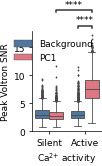

In [83]:
fig1, ax1 = plt.subplots(figsize=(1.8,2.7))
x = "calcium"
y = "max_snr_pk"
hue = "region"
order = ["Silent", "Active"]
hue_order = ["Background", "PC1"]
sns.boxplot(data=snr_df, x=x, y=y, 
    hue=hue,fliersize=1, order=order, hue_order=hue_order, ax=ax1)
ax1.set_xlabel(r"$\mathrm{Ca^{2{+}}}$ activity")
ax1.set_ylabel("Peak Voltron SNR")
ax1.get_legend().set_title("")
ax1.set_ylim(0, 18)

pairs = [[("Active", "Background"), ("Active", "PC1")],
         [("Silent", "PC1"), ("Active", "PC1")],]
annot = Annotator(ax1, pairs, data=snr_df, 
                  x=x,y=y, hue=hue, hue_order=hue_order, order=order)
annot.configure(test="Mann-Whitney", verbose=2, loc="outside",
                comparisons_correction="BH")
annot.apply_and_annotate()
plt.tight_layout()
# plt.savefig(output_datadir/"matched_filter_snr.svg", dpi=300, bbox_inches="tight")

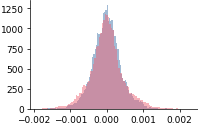

In [64]:
fig1, ax1 = plt.subplots(figsize=(3, 2))
q = ax1.hist(np.array(bg_roi_dffs).ravel(), density=True, bins=100, alpha=0.5)
r = ax1.hist(np.array(roi_dffs).ravel(), density=True, bins=100, alpha=0.5)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Active_Background vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=3.160e+05
Silent_PC1 vs. Active_PC1: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:0.000e+00 U_stat=3.084e+05


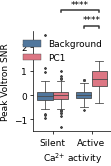

In [37]:
fig1, ax1 = plt.subplots(figsize=(1.8,2.7))
x = "calcium"
y = "dff_skew"
hue = "region"
order = ["Silent", "Active"]
hue_order = ["Background", "PC1"]
sns.boxplot(data=snr_df, x=x, y=y, 
    hue=hue,fliersize=1, order=order, hue_order=hue_order, ax=ax1)
ax1.set_xlabel(r"$\mathrm{Ca^{2{+}}}$ activity")
ax1.set_ylabel("Skewness")
ax1.get_legend().set_title("")
# ax1.set_ylim(0, 18)

pairs = [[("Active", "Background"), ("Active", "PC1")],
         [("Silent", "PC1"), ("Active", "PC1")],]
annot = Annotator(ax1, pairs, data=snr_df, 
                  x=x,y=y, hue=hue, hue_order=hue_order, order=order)
annot.configure(test="Mann-Whitney", verbose=2, loc="outside",
                comparisons_correction="BH")
annot.apply_and_annotate()
plt.tight_layout()

Morpholino analysis

In [399]:
re.search("\w\d\w\w", 'P1UR_F1')

<re.Match object; span=(0, 4), match='P1UR'>

In [403]:
snr_by

,file_name,fs,embryo,offset,random,pk_idx,region,mean_snr_pk,max_snr_pk,mean_snr_tr_noise,mean_snr_tr,temporal_ratio,region_random,calcium,array
5911,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,PC1,3.522618,5.423581,1.999634,2.255862,2.404217,ROI_False,Active,P1UR
5912,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,PC1,3.032215,6.254055,1.827504,2.292029,2.728611,ROI_False,Active,P1UR
5913,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,Background,2.237848,3.195726,2.138169,2.103416,1.519303,BG_ROI_False,Active,P1UR
5914,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,Background,1.849626,2.942827,1.741083,1.723996,1.706980,BG_ROI_False,Active,P1UR
5915,082104P1UR_F1_crop_20Hz,19.466615,P1UR_F1,7990,False,132,Background,1.716128,2.530022,2.028955,2.082894,1.214667,BG_ROI_False,Active,P1UR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,2.030055,2.649058,2.274216,2.353646,1.125513,BG_ROI_False,Active,P1RD
17507,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,2.455699,4.434039,2.583025,2.751683,1.611392,BG_ROI_False,Active,P1RD
17508,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,2.013000,2.968667,2.444733,2.522618,1.176820,BG_ROI_False,Active,P1RD
17509,115157P1RD_D2_20Hz,20.000000,P1RD_D2,20643,False,2320,Background,2.316927,2.966949,2.151931,2.340070,1.267889,BG_ROI_False,Active,P1RD


In [440]:
len(snr_by_x["file_name"].unique())

40

In [404]:
snr_by_x["array"] = [re.search("\w\d\w\w", f).group(0) for f in list(snr_by_x["embryo"])]

<>:1: DeprecationWarning: invalid escape sequence \w


In [70]:
29*33

957

In [420]:
pos_symb = "KD"
neg_symb = "Ctrl"
snr_by_x["tnnt2a"] = snr_by_x["array"].map(
    {
        "P1UL": pos_symb,
        "P1UR": pos_symb,
        "P2LR": pos_symb,
        "P2UL": pos_symb,
        "P2LL": neg_symb,
        "P1RD": pos_symb,
    }
)
snr_by_x["cacna1c"] = snr_by_x["array"].map(
    {
        "P1UL": neg_symb,
        "P1UR": neg_symb,
        "P2LR": pos_symb,
        "P2UL": neg_symb,
        "P2LL": pos_symb,
        "P1RD": neg_symb,
    }
)

In [421]:
morpholino_df= snr_by_x[snr_by_x["array"].isin(["P2UL", "P2LR", "P2LL"])]

In [443]:
morpholino_df.groupby("cacna1c")["embryo"].nunique()

cacna1c
Ctrl     7
KD      15
Name: embryo, dtype: int64

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Ctrl vs. KD: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.597e-208 U_stat=1.516e+06


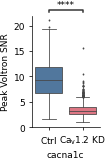

In [437]:
fig1, ax1 = plt.subplots(figsize=(1.65,2.5))
data = morpholino_df.loc["ROI"]
x = "cacna1c"
y = "max_snr_pk"
hue = "region"
order = ["Ctrl", "KD"]
sns.boxplot(data=data, x=x, y=y, 
    fliersize=1, order=order, ax=ax1)
ax1.set_ylim(0, 22)
pairs = [("Ctrl", "KD")]
annot = Annotator(ax1, pairs, data=data, 
                  x=x, y=y)
annot.configure(test="Mann-Whitney", verbose=2, loc="outside",
                comparisons_correction="BH")
annot.apply_and_annotate()
ax1.set_xticklabels([r"$\mathrm{Ctrl}$", r"$\mathrm{Ca_v1.2}$ KD"])
ax1.set_ylabel("Peak Voltron SNR")
plt.tight_layout()
plt.savefig(output_datadir/"cavmo_kd_snr.svg", dpi=300, bbox_inches="tight")

Rough work

Apply matched filtering to entire voltage dFF trace

In [210]:
v_norm_scaled = ss.fit_transform(v_dFF.reshape(v_dFF.shape[0], -1))

In [211]:
corr = ndimage.correlate(v_norm_scaled, kv_syn[:, None], mode="nearest")/len(kv_syn)

In [212]:
corr_img = corr.reshape(v_dFF.shape)

In [213]:
corr_trace_test = images.extract_mask_trace(corr_img, roi_masks[0])

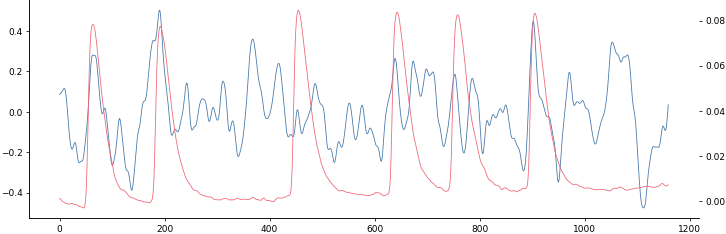

In [214]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(corr_trace_test)
ax2 = ax1.twinx()
ax2.plot(v[0], color="C1")

Try downsampling

In [215]:
scale_factor = 2
v_ds = images.downsample_video(v_dFF, scale_factor)

In [228]:
new_roi_masks = []
for i in range(props.shape[0]):
    new_roi_mask = np.zeros(v_ds.shape[1:], dtype=bool)
    print(new_roi_mask.shape)
    r, c = props.loc[i, ["centroid-0", "centroid-1"]]//scale_factor
    roi = draw.disk((r,c), radius, shape=new_roi_mask.shape)
    new_roi_mask[roi] = True
    new_roi_masks.append(new_roi_mask)

(214, 208)
(214, 208)


In [217]:
v_ds_scaled = ss.fit_transform(v_ds.reshape(v_ds.shape[0], -1))

In [267]:
kv_syn_norm = kv_syn/np.sqrt(np.sum(kv_syn**2))

In [278]:
vt = v_ds.reshape(v_ds.shape[0], -1)
noise_mask = np.zeros(vt.shape[0])
noise_mask[pks] = True
noise_mask = ~np.convolve(noise_mask, np.ones(100), mode="same").astype(bool)
est_var = vt[noise_mask,:].var(axis=0)

In [312]:
var_strict = vt.var(axis=0)

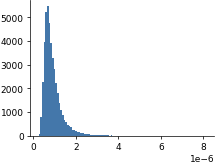

In [313]:
q = plt.hist(var_strict, bins=100)

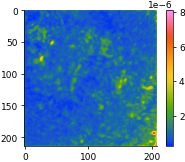

In [304]:
q = plt.imshow(var_strict.reshape(v_ds.shape[1:]))
plt.colorbar(q)

In [293]:
snr = ndimage.correlate(vt, kv_syn_norm[:,None], mode="nearest")**2/est_var

In [294]:
snr_img = snr.reshape(v_ds.shape)

In [297]:
snr_traces = np.array([images.extract_mask_trace(snr_img, roi_mask) for roi_mask in new_roi_masks])

In [299]:
pc1_snr = images.extract_mask_trace(snr_img, (pc1 > filters.threshold_otsu(pc1))[::scale_factor,::scale_factor])

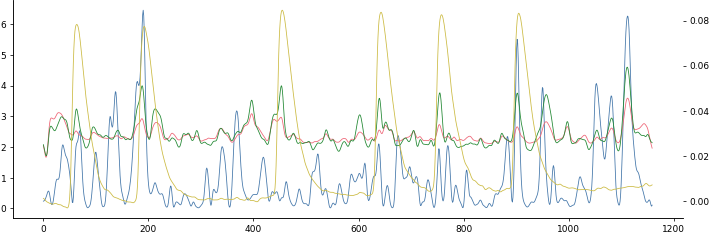

In [314]:
fig1, ax1 = plt.subplots(figsize=(12,4))
# ax1.plot(corr_traces_ds[0])
# ax1.plot(corr_traces_ds[1])
ax1.plot(snr_img.mean(axis=(1,2))**0.5)
ax1.plot(pc1_snr**0.5)
# ax1.plot(corr_traces_ds.mean(axis=0))
# ax1.plot(corr_trace_test)

ax2 = ax1.twinx()
ax2.plot(v[0], color="C3")

In [219]:
corr_ds = ndimage.correlate(v_ds_scaled, kv_syn[:, None], mode="nearest")/len(kv_syn)
corr_img_ds = corr_ds.reshape(v_ds.shape)

In [251]:
corr_traces_ds = np.array([images.extract_mask_trace(corr_img_ds, roi_mask) for roi_mask in new_roi_masks])


In [264]:
pc1_corr = images.extract_mask_trace(corr_img_ds, (pc1 > filters.threshold_otsu(pc1))[::scale_factor,::scale_factor])

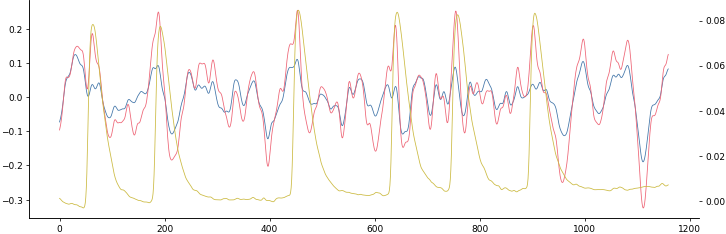

In [263]:
fig1, ax1 = plt.subplots(figsize=(12,4))
# ax1.plot(corr_traces_ds[0])
# ax1.plot(corr_traces_ds[1])
ax1.plot(corr_img_ds.mean(axis=(1,2)))
ax1.plot(pc1_corr/)
# ax1.plot(corr_traces_ds.mean(axis=0))
# ax1.plot(corr_trace_test)

ax2 = ax1.twinx()
ax2.plot(v[0], color="C3")
# ax2.plot(v_dFF)

All calcium spikes have a voltage spike:

1. Get voltage spike kernels from calcium-triggered voltage averages.
2. Correlate voltage kernel with whole voltage dFF image.
3. Consider correlation between voltage and calcium at spikes and 

Load voltage imaging data

In [20]:
subfolder_voltage = "cam1_registered_downsampled"
voltage_image, metadata = images.load_image(rootdir, file_name, subfolder=subfolder_voltage)

/n/home11/bjia/SpikeCounter/spikecounter/analysis/images.py:222: UserWarning: 1.0 frames dropped
  warnings.warn(f"{n_frames_dropped} frames dropped")


In [102]:
potential_bg_traces_v.T.shape

(3, 1166)

In [153]:
potential_bg_traces_v = images.extract_background_traces(
    voltage_image,
    mode=["linear", "biexp", "mean"],
    corner_divs=8,
    dark_percentile=5,
).astype(np.float32)
multi_regressed_v = images.regress_video(voltage_image, potential_bg_traces_v.T[2,None])
multi_regressed_v = images.regress_video(multi_regressed_v, potential_bg_traces_v.T[0,None])

[10.202630897421432, -0.0008784631646020875, 193.8499870510072, -0.0043923158230104375, 4763.841914198852]


/n/home11/bjia/SpikeCounter/spikecounter/analysis/traces.py:347: RuntimeWarning: overflow encountered in exp
  lambda y, a, b: a * np.exp(b * (y - trace)),
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


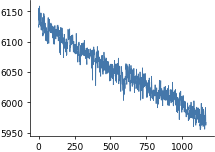

In [104]:
plt.plot(voltage_image.mean(axis=(1,2)))

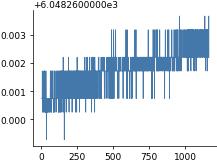

In [105]:
plt.plot(multi_regressed_v.mean(axis=(1,2)))

In [24]:
with open(output_datadir / f"{file_name}_ca_peaks.pickle", "rb") as f:
    peak_props = pickle.load(f)

In [38]:
pks = peak_props["peaks"]

In [64]:
pks = np.random.choice(np.arange(25, multi_regressed_v.shape[0]-125), size=6, replace=False)

In [62]:
ca_triggered_sta_v, _ = images.spike_triggered_average_video(
    multi_regressed_v, pks, (25, 125)
)

In [40]:
dFF_test = images.get_image_dFF(ca_triggered_sta_v, invert=True)

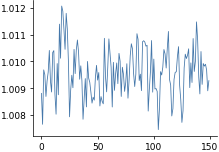

In [42]:
plt.plot(dFF_test.mean(axis=(1,2)))

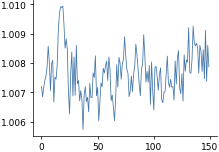

In [43]:
plt.plot(images.extract_mask_trace(dFF_test, roi_mask))

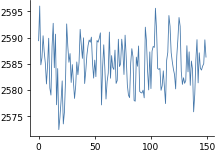

In [32]:
plt.plot(images.extract_mask_trace(ca_triggered_sta_v, mean_img < np.nanpercentile(mean_img, 10)))

In [164]:
mean_img = multi_regressed_v.mean(axis=0)

In [172]:
v_dFF2 = images.get_image_dFF(
    ndimage.gaussian_filter(multi_regressed_v.astype(float), (2, 5, 5)),
    invert=True,
)-1

In [173]:
pks = peak_props["peaks"]

In [155]:
raw_dff = images.get_image_dFF(multi_regressed_v)

In [174]:
pks = peak_props["peaks"]
# pks = np.random.choice(np.arange(25, multi_regressed_v.shape[0]-125), size=6, replace=False)
ca_triggered_sta_v1, _ = images.spike_triggered_average_video(
    v_dFF2, pks, (25, 125)
)

In [175]:
pks = np.random.choice(np.arange(25, multi_regressed_v.shape[0]-125), size=6, replace=False)
ca_triggered_sta_v2, _ = images.spike_triggered_average_video(
    v_dFF2, pks, (25, 125)
)

(-0.14424250691407603, 0.07823067781681173)


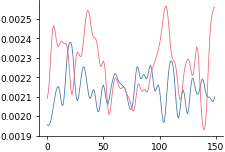

In [176]:
t1 = ca_triggered_sta_v1.mean(axis=(1,2))
t2 = ca_triggered_sta_v2.mean(axis=(1,2))
plt.plot(t1)
plt.plot(t2)
print(stats.pearsonr(t1, t2))

(0.2501477060301194, 0.002019987466533138)


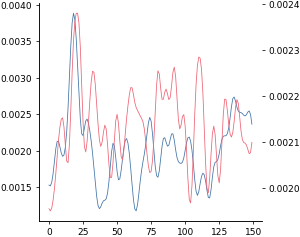

In [180]:
fig1, ax1 = plt.subplots(figsize=(4,4))
t1 = images.extract_mask_trace(ca_triggered_sta_v1, roi_masks[0]+roi_masks[1])
t2 = ca_triggered_sta_v1.mean(axis=(1,2))
ax1.plot(t1)
ax2 = ax1.twinx()
ax2.plot(t2, color="C1")
print(stats.pearsonr(t1, t2))

In [151]:
utils.display_zstack(ca_triggered_sta_v1)

interactive(children=(IntSlider(value=74, description='z', max=149), Dropdown(description='c', options=('all',…

In [152]:
utils.display_zstack(ca_triggered_sta_v2)

interactive(children=(IntSlider(value=74, description='z', max=149), Dropdown(description='c', options=('all',…

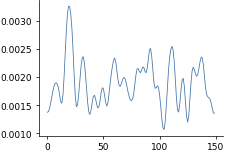

In [277]:
rd = v_dFF2.reshape(v_dFF2.shape[0], -1).T
u, s, v2 = randomized_svd(rd, n_components=15)

In [279]:
axs.shape

(15, 2)

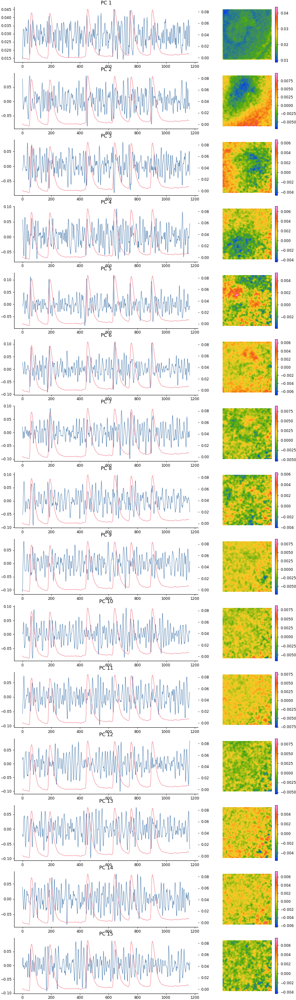

In [280]:
plt.close("all")
fig1, axs = visualize.plot_pca_data(v2, rd, v_dFF2.shape[1:], mode="spatial", single_figsize=(12,3), n_components=15)
for ax in axs:
    ax2 = ax[0].twinx()
    ax2.plot(v[0], color="C1")

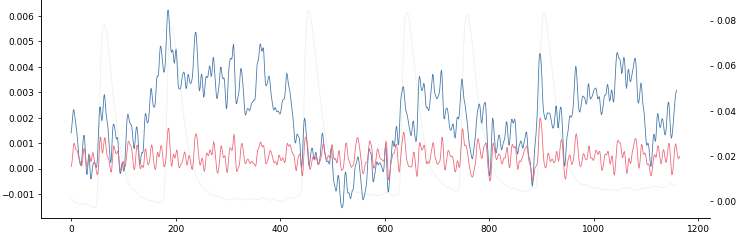

In [256]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(images.extract_mask_trace(v_dFF, roi_masks[0]))
ax1.plot(images.extract_mask_trace(v_dFF2, roi_masks[0]))
ax2 = ax1.twinx()
# ax2.plot(images.extract_mask_trace(multi_regressed_v, roi_masks[0]), color="C2", alpha=0.1)
ax2.plot(v[0], color="C2", alpha=0.1)

In [257]:
v_norm_scaled2 = ss.fit_transform(v_dFF2.reshape(v_dFF2.shape[0], -1))
corr = ndimage.correlate(v_norm_scaled2, kv_syn[:, None], mode="nearest")/len(kv_syn)
corr_img2 = corr.reshape(v_dFF2.shape)


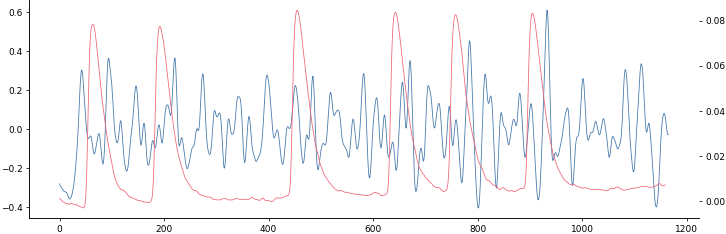

In [258]:
corr_trace_test2 = images.extract_mask_trace(corr_img2, morphology.binary_dilation(roi_masks[0], 
                                                                                  morphology.disk(7)))
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(corr_trace_test2)
ax2 = ax1.twinx()
ax2.plot(v[0], color="C1")

In [110]:
frame_start = 1
frame_end = voltage_image.shape[0] - 5

In [111]:
metadata = utils.load_video_metadata(rootdir, file_name)
dt_dict, t = utils.traces_to_dict(metadata)
t1 = t[frame_start:frame_end]

In [112]:
v_dFF = skio.imread(rootdir/"analysis"/file_name/f"{file_name}_v_dFF_smoothed.tif")
ca_dFF = skio.imread(rootdir/"analysis"/file_name/f"{file_name}_ca_dFF_smoothed.tif")

In [113]:
rd = ca_dFF.reshape(ca_dFF.shape[0], -1).T
u, s, v = randomized_svd(rd, n_components=15)
pc1 = np.abs(u[:, 0].reshape(ca_dFF.shape[1:]))
pc1_mask = pc1 > filters.threshold_otsu(pc1)
ca_trace1 = images.extract_mask_trace(ca_dFF, pc1_mask)
ca_trace_smoothed = ndimage.gaussian_filter(ca_trace, 2)
v_trace1 = images.extract_mask_trace(v_dFF, pc1_mask)

PCA denoising

In [14]:
rd = dFF_smoothed_v.reshape(dFF_smoothed_v.shape[0], -1).T
u, s, v = randomized_svd(rd, n_components=15)

(<Figure size 1200x4500 with 45 Axes>,
 array([[<Axes: title={'center': 'PC 1'}>, <Axes: >],
        [<Axes: title={'center': 'PC 2'}>, <Axes: >],
        [<Axes: title={'center': 'PC 3'}>, <Axes: >],
        [<Axes: title={'center': 'PC 4'}>, <Axes: >],
        [<Axes: title={'center': 'PC 5'}>, <Axes: >],
        [<Axes: title={'center': 'PC 6'}>, <Axes: >],
        [<Axes: title={'center': 'PC 7'}>, <Axes: >],
        [<Axes: title={'center': 'PC 8'}>, <Axes: >],
        [<Axes: title={'center': 'PC 9'}>, <Axes: >],
        [<Axes: title={'center': 'PC 10'}>, <Axes: >],
        [<Axes: title={'center': 'PC 11'}>, <Axes: >],
        [<Axes: title={'center': 'PC 12'}>, <Axes: >],
        [<Axes: title={'center': 'PC 13'}>, <Axes: >],
        [<Axes: title={'center': 'PC 14'}>, <Axes: >],
        [<Axes: title={'center': 'PC 15'}>, <Axes: >]], dtype=object))

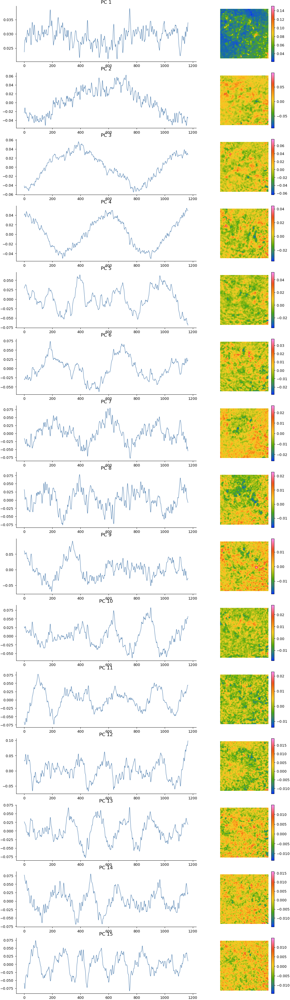

In [16]:
plt.close("all")
visualize.plot_pca_data(v, rd, dFF_smoothed_v.shape[1:], mode="spatial", single_figsize=(12,3), n_components=15)

In [56]:
comp_vid = images.extract_cropped_region_image(np.outer(u[:,0], v[0,:]).T, dFF_smoothed_v.shape)

Single PC looks weird (because it will just cause fluctuations that scale linearly across the whole image)

In [57]:
skio.imsave(test_processing_dir/f"{file_name}_PC1.tif", comp_vid.astype(np.float32))

/tmp/ipykernel_1157/1032254091.py:1: UserWarning: /mnt/e/Documents/Cohen Lab/Data/20230323_simultaneous_gcamp_voltron/cam1_registered_preprocess_test/082104M1_crop_20Hz_PC1.tif is a low contrast image
  skio.imsave(test_processing_dir/f"{file_name}_PC1.tif", comp_vid.astype(np.float32))


With multiple PCs you can get something that looks more like a wave.

In [60]:
indices = np.zeros_like(s, dtype=bool)
indices[[0,1]] = True
indices = np.ones_like(s, dtype=bool)
comp_vid = sstats.reconstruct_svd(u,s,v, indices).T.reshape(dFF_smoothed_v.shape)

In [61]:
skio.imsave(test_processing_dir/f"{file_name}_multiPC.tif", comp_vid.astype(np.float32))

/tmp/ipykernel_1157/811257882.py:1: UserWarning: /mnt/e/Documents/Cohen Lab/Data/20230323_simultaneous_gcamp_voltron/cam1_registered_preprocess_test/082104M1_crop_20Hz_multiPC.tif is a low contrast image
  skio.imsave(test_processing_dir/f"{file_name}_multiPC.tif", comp_vid.astype(np.float32))


In [62]:
indices = np.ones_like(s, dtype=bool)
comp_vid = sstats.reconstruct_svd(u,s,v, indices).T.reshape(dFF_smoothed_v.shape)
skio.imsave(test_processing_dir/f"{file_name}_multiPC_no_denoise.tif", comp_vid.astype(np.float32))

/tmp/ipykernel_1157/561328172.py:3: UserWarning: /mnt/e/Documents/Cohen Lab/Data/20230323_simultaneous_gcamp_voltron/cam1_registered_preprocess_test/082104M1_crop_20Hz_multiPC_no_denoise.tif is a low contrast image
  skio.imsave(test_processing_dir/f"{file_name}_multiPC_no_denoise.tif", comp_vid.astype(np.float32))


In [8]:
os.listdir(rootdir/file_name)

FileNotFoundError: [Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20230323_simultaneous_gcamp_voltron/105233P2LR_F2_20Hz'

In [249]:
subfolder_calcium = "cam2_registered_downsampled"
calcium_image, metadata = images.load_image(rootdir, file_name, subfolder=subfolder_calcium)
frame_end = 5
frame_end = calcium_image.shape[0] - frame_end
frame_start = 1
calcium_image = calcium_image[frame_start:frame_end]

/n/home11/bjia/SpikeCounter/spikecounter/analysis/images.py:221: UserWarning: 1.0 frames dropped
  warnings.warn(f"{n_frames_dropped} frames dropped")


In [261]:
utils.reload_libraries([images, traces])

In [262]:
potential_bg_traces = images.extract_background_traces(calcium_image, mode=["biexp"])

[0.6736548280478133, -0.0008966044777816058, 12.79944173290845, -0.004483022388908029, 97.47882435169939]


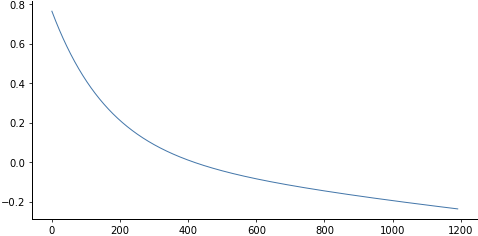

In [263]:
fig1, ax1 = plt.subplots(figsize=(8,4))
q = visualize.stackplot(potential_bg_traces.T, ax=ax1)

In [264]:
mean_trace = calcium_image.mean(axis=(1,2))

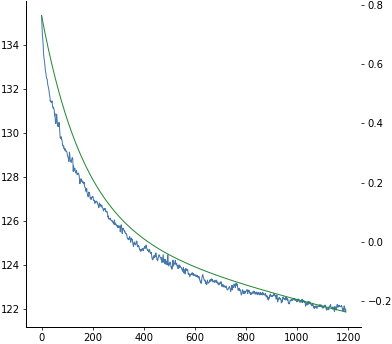

In [266]:
fig1, ax1 = plt.subplots(figsize=(6,6))
ax1.plot(mean_trace)
ax2 = ax1.twinx()
ax2.plot(potential_bg_traces, color="C2")

In [270]:
multi_regressed = images.regress_video(calcium_image, potential_bg_traces.T)

In [271]:
mean_trace_regressed = multi_regressed.mean(axis=(1,2))

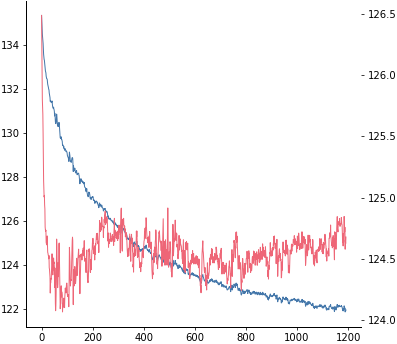

In [272]:
fig1, ax1 = plt.subplots(figsize=(6,6))
ax1.plot(mean_trace)
ax2 = ax1.twinx()
ax2.plot(mean_trace_regressed, color="C1")

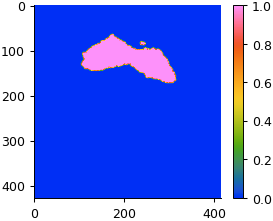

In [67]:
temporal_variance_ca = multi_regressed.var(axis=0)
selection_mask = temporal_variance_ca > filters.threshold_otsu(temporal_variance_ca)
selection_mask = morphology.binary_opening(selection_mask, morphology.disk(3))
plt.imshow(selection_mask)
cb = plt.colorbar()
ca_trace = images.extract_mask_trace(multi_regressed, selection_mask)

In [68]:
cb.ax

<Axes: label='<colorbar>'>

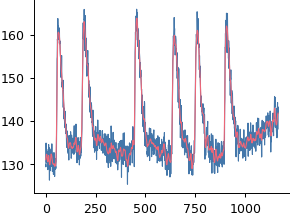

In [69]:
plt.plot(ca_trace)
ca_trace_smoothed = ndimage.gaussian_filter(ca_trace, 2)
plt.plot(ca_trace_smoothed)

In [70]:
pks, _ = signal.find_peaks(ca_trace_smoothed, prominence = 0.3*(ca_trace_smoothed.max()-ca_trace_smoothed.min()))

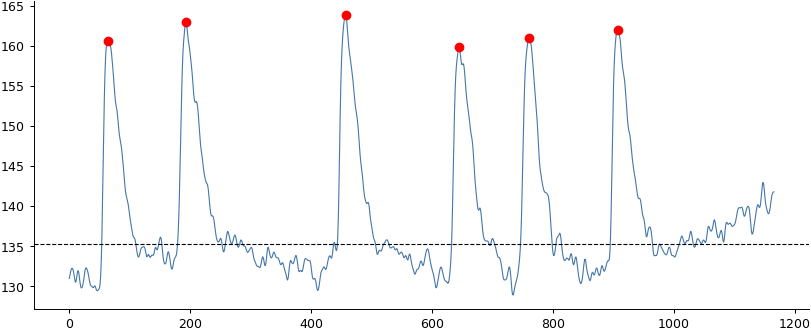

In [71]:
plt.close("all")
fig1, ax1, cs, offset = visualize.stackplot(ca_trace_smoothed[None,:], figsize_single=(10,4))
ax1.plot(pks, ca_trace_smoothed[pks], "o", color="red")
ax1.axhline(np.median(ca_trace_smoothed), color="black", linestyle="--")

In [72]:
ca_dFF = images.get_image_dFF(ndimage.gaussian_filter(multi_regressed, (2,3,3)), invert=False) - 1
skio.imsave(test_processing_dir/f"{file_name}_ca_dFF_smoothed.tif", ca_dFF.astype(np.float32))

In [ ]:
v_raw_smoothed = ndimage.gaussian_filter(multi_regressed, (2,3,3))
mean_img = v_raw_smoothed.mean(axis=0)
v_raw_smoothed = (mean_img - v_raw_smoothed)/mean_img

In [154]:
ca_dFF = skio.imread(test_processing_dir/f"{file_name}_ca_dFF_smoothed.tif")

In [81]:
utils.reload_libraries([images])

float32
float32


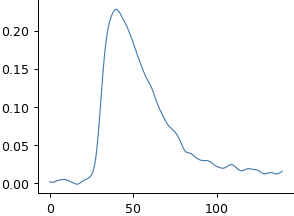

In [82]:
ca_triggered_sta_ca, _ = images.spike_triggered_average_video(ca_dFF, pks, (40, 100))
plt.plot(images.extract_mask_trace(ca_triggered_sta_ca, selection_mask))

In [90]:
dt

NameError: name 'dt' is not defined

In [35]:
window_size = 111
ca_triggered_sta_v, _ = images.spike_triggered_average_video(dFF_smoothed_v, pks, (40, 100))
mask_trace_v = images.extract_mask_trace(ca_triggered_sta_v, selection_mask)
mask_trace_ca = images.extract_mask_trace(ca_triggered_sta_ca, selection_mask)
mask_trace_v_padded = np.pad(mask_trace_v, (window_size//2, window_size//2), mode="reflect")
mask_trace_ca_padded = np.pad(mask_trace_ca, (window_size//2, window_size//2), mode="reflect")
mask_trace_v_ma = np.convolve(mask_trace_v_padded, np.ones(window_size)/window_size, mode="valid")
mask_trace_ca_ma = np.convolve(mask_trace_ca_padded, np.ones(window_size)/window_size, mode="valid")

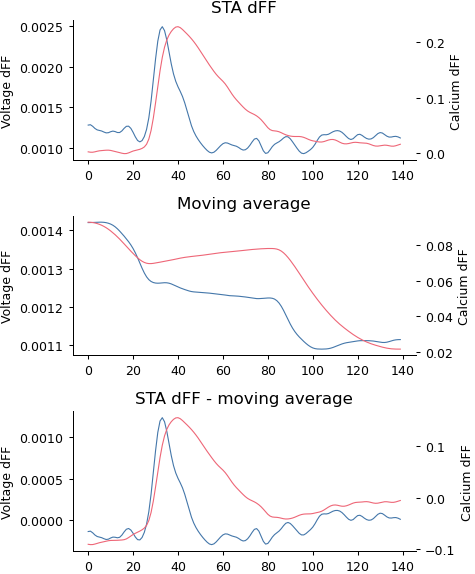

In [36]:
fig1, axs = plt.subplots(3,1, figsize=(5,6))
axs[0].plot(mask_trace_v)
ax2 = axs[0].twinx()
ax2.plot(mask_trace_ca, color="C1")
axs[0].set_ylabel("Voltage dFF")
ax2.set_ylabel("Calcium dFF")
axs[0].set_title("STA dFF")

axs[1].plot(mask_trace_v_ma)
ax2 = axs[1].twinx()
ax2.plot(mask_trace_ca_ma, color="C1")
axs[1].set_ylabel("Voltage dFF")
ax2.set_ylabel("Calcium dFF")
axs[1].set_title("Moving average")

axs[2].plot(mask_trace_v - mask_trace_v_ma)
ax2 = axs[2].twinx()
ax2.plot(mask_trace_ca - mask_trace_ca_ma, color="C1")
axs[2].set_ylabel("Voltage dFF")
ax2.set_ylabel("Calcium dFF")
axs[2].set_title("STA dFF - moving average")
plt.tight_layout()

In [158]:
sta_corr = signal.correlate(mask_trace_v, mask_trace_ca)
ca_lag = np.argmax(sta_corr) - mask_trace_v.size + 1

In [159]:
combined_sta_vid = np.stack([ca_triggered_sta_ca, ca_triggered_sta_v], axis=1)
skio.imsave(test_processing_dir/f"{file_name}_ca_triggered_sta.tif", combined_sta_vid.astype(np.float32))

Identify regions of calcium activity

In [160]:
rd = ca_dFF.reshape(ca_dFF.shape[0], -1).T
u, s, v = randomized_svd(rd, n_components=15)

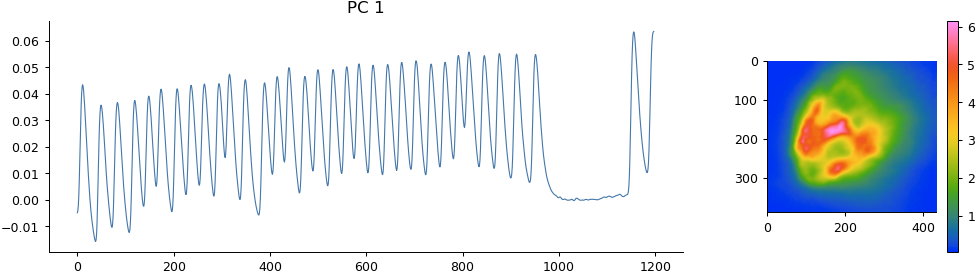

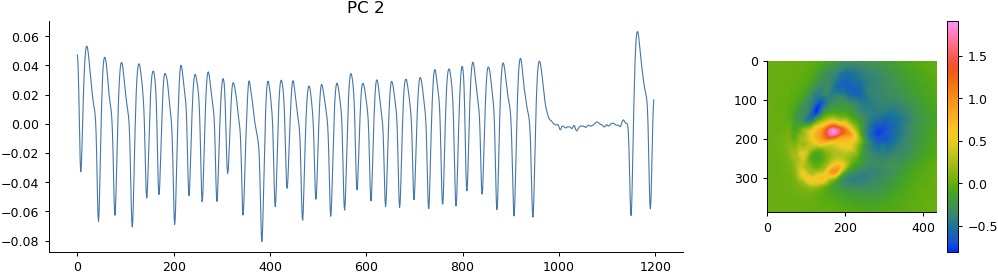

In [161]:
plt.close("all")
visualize.plot_pca_data(v, rd, ca_dFF.shape[1:], mode="spatial", figsize=(12,3), n_components=2)

(<Figure size 400x400 with 1 Axes>,
 <Axes: >,
 <matplotlib.image.AxesImage at 0x7f4933dd20d0>)

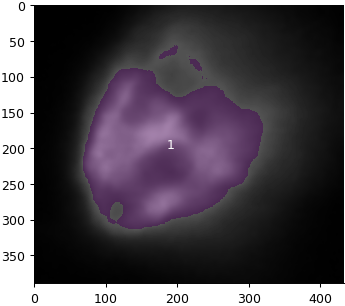

In [162]:
pc1 = np.abs(u[:,0].reshape(ca_dFF.shape[1:]))
pc1_mask = pc1 > filters.threshold_otsu(pc1)
fig1, ax1 = plt.subplots(figsize=(4,4))
visualize.display_roi_overlay(pc1,pc1_mask, alpha=0.5, ax = ax1)

Now downsample by a certain amount

In [227]:
ca_dFF = skio.imread(test_processing_dir/f"{file_name}_ca_dFF_smoothed.tif")
v_dFF = skio.imread(test_processing_dir/f"{file_name}_dFF_smoothed.tif")

In [228]:
factor = 16
mask_downsampled = np.round(images.downsample_video(pc1_mask[None,:,:], factor)).astype(bool)
v_downsampled = images.downsample_video(v_dFF, factor)
ca_downsampled = images.downsample_video(ca_dFF, factor)

Calculate the correlation between calcium and voltage across the entire recording.

In [14]:
v_downsampled_ravelled = v_downsampled.reshape(v_downsampled.shape[0], -1).T
ca_downsampled_ravelled = ca_downsampled.reshape(ca_downsampled.shape[0], -1).T

In [15]:
# This is the fastest method I've found so far (compared to 2D loop, or 1D loop with signal.correlate, or stats.pearsonr, or np.corrcoef)
v_dsr_norm = v_downsampled_ravelled - v_downsampled_ravelled.mean(axis=1)[:, None]
ca_dsr_norm = ca_downsampled_ravelled - ca_downsampled_ravelled.mean(axis=1)[:, None]
den = np.sqrt(v_dsr_norm.std(axis=1)[:, None]*ca_dsr_norm.std(axis=1)[:, None]*v_dsr_norm.shape[1])
v_dsr_norm /= den
ca_dsr_norm /= den
corrs_of_interest = np.zeros(v_dsr_norm.shape[0])
for i in range(v_dsr_norm.shape[0]):
    corrs_of_interest[i] = np.correlate(v_dsr_norm[i,:], ca_dsr_norm[i,:], mode="valid")[0]
corr_img = corrs_of_interest.reshape(v_downsampled.shape[1:])

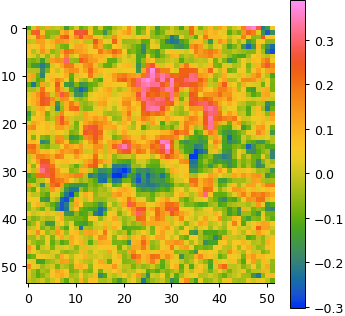

In [18]:
fig1, ax1 = plt.subplots(figsize=(4,4))
q = ax1.imshow(corr_img)
fig1.colorbar(q)

Now plot local correlation over time

In [282]:
v_dsr_norm = v_downsampled_ravelled - v_downsampled_ravelled.mean(axis=1)[:, None]
ca_dsr_norm = ca_downsampled_ravelled - ca_downsampled_ravelled.mean(axis=1)[:, None]
# v_dsr_norm = v_downsampled_ravelled
# ca_dsr_norm = ca_downsampled_ravelled
den = np.sqrt(v_dsr_norm.var(axis=1)[:, None]*ca_dsr_norm.var(axis=1)[:, None]*v_dsr_norm.shape[1]**2)
window_size = 61
element_wise_product = (v_dsr_norm * ca_dsr_norm)/den
kernel = np.ones((1,window_size)) * np.sqrt(v_dsr_norm.shape[1]/window_size)

In [283]:
local_corrs = signal.correlate(element_wise_product, kernel, mode="same")

In [ ]:
fig1, ax1 = plt.subplots(figsize=(12,4))
has_calcium_activity = np.zeros_like(local_corrs, dtype=bool)
has_calcium_activity[mask_downsampled.ravel(),:] = True
# has_calcium_activity = np.ma.masked_array(has_calcium_activity, ~has_calcium_activity)
q = ax1.imshow(np.abs(local_corrs), aspect="auto", cmap="cet_CET_L8")
ax1.imshow(has_calcium_activity, aspect="auto", cmap="gray", alpha=0.2)
ymin, ymax = ax1.get_ylim()
fig1.colorbar(q)
ax1.vlines(pks, ymin, ymax, color="black")

Calculate Pearson Rs using moving means

In [229]:
v_downsampled_ravelled = v_downsampled.reshape(v_downsampled.shape[0], -1).T
ca_downsampled_ravelled = ca_downsampled.reshape(ca_downsampled.shape[0], -1).T
# Require odd window size
window_size = 111
ma_kernel = np.ones((1,window_size))/window_size
sum_kernel = np.ones((1,window_size))
v_padded = np.pad(v_downsampled_ravelled, ((0,0),(window_size//2,window_size//2)), mode="reflect")
ca_padded = np.pad(ca_downsampled_ravelled, ((0,0),(window_size//2,window_size//2)), mode="reflect")
v_ma = signal.convolve(v_padded, ma_kernel, mode="valid")
ca_ma = signal.convolve(ca_padded, ma_kernel, mode="valid")

num = signal.convolve(v_padded*ca_padded, sum_kernel, mode="valid") + v_ma*ca_ma*window_size - \
    v_ma*signal.convolve(ca_padded, sum_kernel, mode="valid") - \
    ca_ma*signal.convolve(v_padded, sum_kernel, mode="valid")

v_m_moment2 = (v_ma**2*window_size - 2*signal.convolve(v_padded, sum_kernel, mode="valid")*v_ma + signal.convolve(v_padded**2, sum_kernel, mode="valid"))
ca_m_moment2 = (ca_ma**2*window_size - 2*signal.convolve(ca_padded, sum_kernel, mode="valid")*ca_ma + signal.convolve(ca_padded**2, sum_kernel, mode="valid"))
den = np.sqrt(v_m_moment2*ca_m_moment2)

local_corrs = num/den

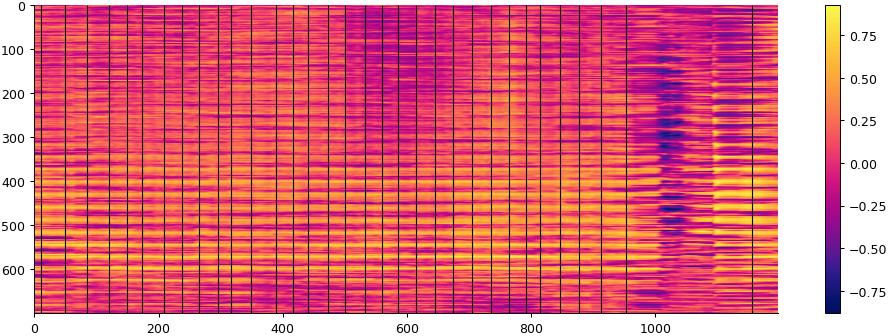

In [230]:
fig1, ax1 = plt.subplots(figsize=(12,4))
has_calcium_activity = np.zeros_like(local_corrs, dtype=bool)
has_calcium_activity[mask_downsampled.ravel(),:] = True
# has_calcium_activity = np.ma.masked_array(has_calcium_activity, ~has_calcium_activity)
q = ax1.imshow(local_corrs, aspect="auto", cmap="cet_CET_L8")
# ax1.imshow(has_calcium_activity, aspect="auto", cmap="gray", alpha=0.5)
ymin, ymax = ax1.get_ylim()
fig1.colorbar(q)
ax1.vlines(pks, ymin, ymax, color="black")

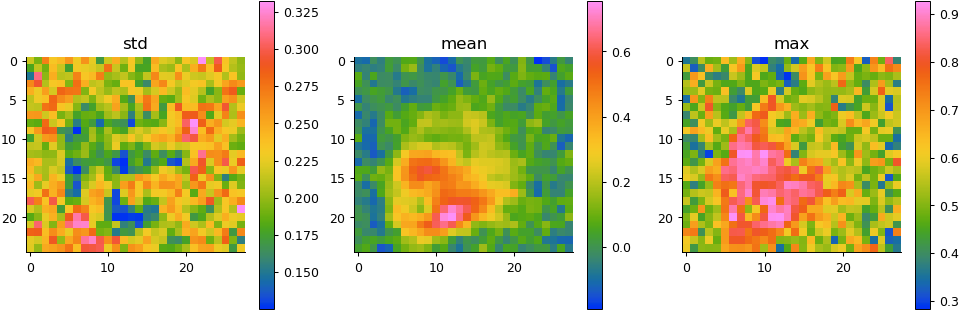

In [231]:
std_corr_img = np.std(local_corrs, axis=1).reshape(v_downsampled.shape[1:])
mean_corr_img = np.mean(local_corrs, axis=1).reshape(v_downsampled.shape[1:])
max_corr_img = np.max(local_corrs, axis=1).reshape(v_downsampled.shape[1:])
fig1, axs = plt.subplots(1,3, figsize=(12,4))
q = axs[0].imshow(std_corr_img)
axs[0].set_title("std")
fig1.colorbar(q, ax=axs[0])
q = axs[1].imshow(mean_corr_img)
axs[1].set_title("mean")
fig1.colorbar(q, ax=axs[1])
q = axs[2].imshow(max_corr_img)
axs[2].set_title("max")
fig1.colorbar(q, ax=axs[2])

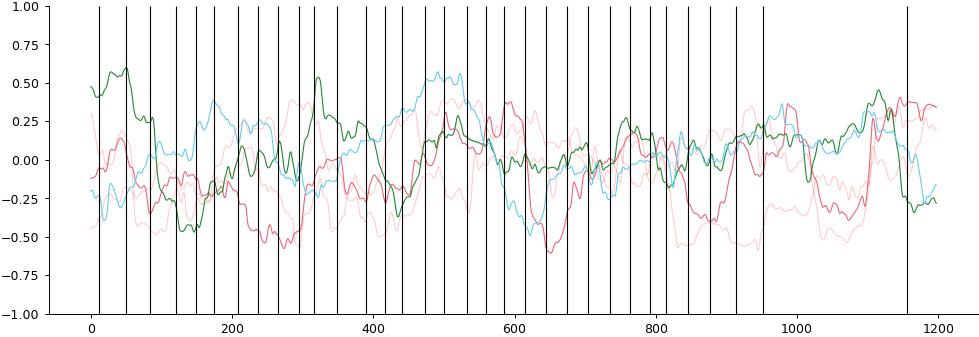

In [215]:
randpx = np.random.choice(np.arange(v_downsampled_ravelled.shape[0]), size=5, replace=False)
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.set_ylim(-1,1)
for i, px in enumerate(randpx):
    color = "red" if has_calcium_activity[px, 0] else f"C{i}"
    alpha = 0.2 if has_calcium_activity[px, 0] else 1
    ax1.plot(local_corrs[px,:], color=color, alpha=alpha)
ymin, ymax = ax1.get_ylim()
ax1.vlines(pks, ymin, ymax, color="black")

In [232]:
corr_video = local_corrs.T.reshape(v_downsampled.shape).astype(np.float32)
skio.imsave(test_processing_dir/f"{file_name}_corr_video.tif", corr_video)

In [172]:
active_calcium_mean_corrs = local_corrs[has_calcium_activity[:,0],:].mean(axis=0)
inactive_calcium_mean_corrs = np.nanmean(local_corrs[~has_calcium_activity[:,0],:], axis=0)
random_mask = np.zeros(has_calcium_activity.shape[0], dtype=bool)
random_mask[np.random.choice(np.arange(has_calcium_activity.shape[0]), size=np.sum(has_calcium_activity[:,0]).astype(int), replace=False)] = True
random_px_mean_corrs = local_corrs[random_mask].mean(axis=0)

Text(0, 0.5, 'Mean local correlation')

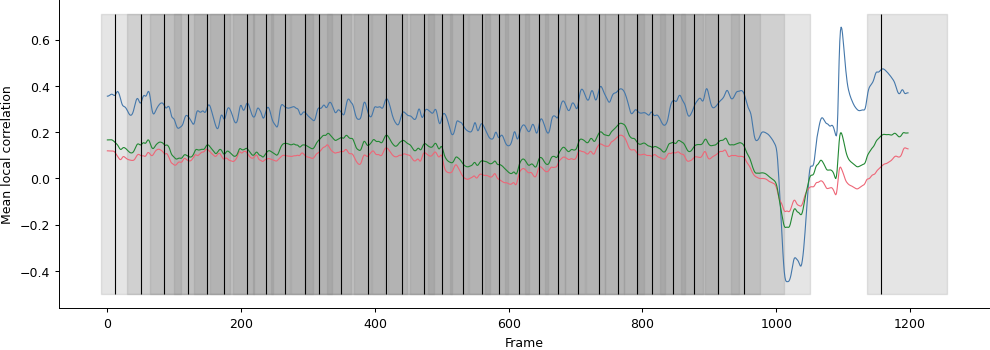

In [173]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(active_calcium_mean_corrs, color="C0")
ax1.plot(inactive_calcium_mean_corrs, color="C1")
ax1.plot(random_px_mean_corrs, color="C2")

ymin, ymax = ax1.get_ylim()
ax1.vlines(pks, ymin, ymax, color="black")
for pk in pks:
    ax1.fill_between(np.arange(pk-20, pk+100), ymin, ymax, color="gray", alpha=0.2)
ax1.set_xlabel("Frame")
ax1.set_ylabel("Mean local correlation")

Text(0, 0.5, 'Mean local correlation')

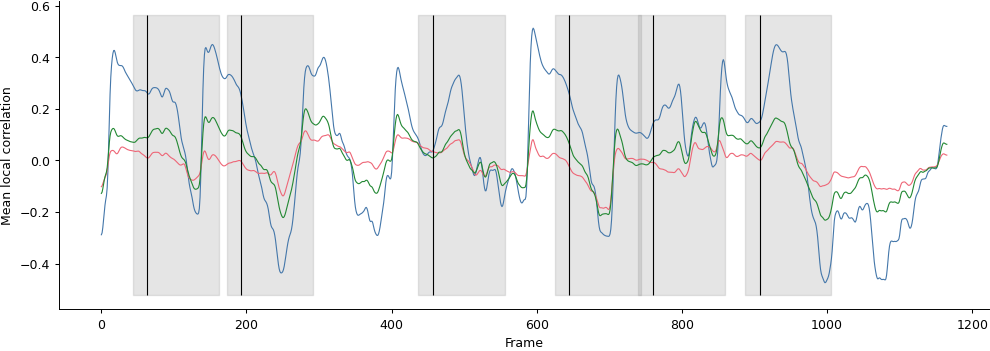

In [86]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(active_calcium_mean_corrs, color="C0")
ax1.plot(inactive_calcium_mean_corrs, color="C1")
ax1.plot(random_px_mean_corrs, color="C2")

ymin, ymax = ax1.get_ylim()
ax1.vlines(pks, ymin, ymax, color="black")
for pk in pks:
    ax1.fill_between(np.arange(pk-20, pk+100), ymin, ymax, color="gray", alpha=0.2)
ax1.set_xlabel("Frame")
ax1.set_ylabel("Mean local correlation")

Text(0, 0.5, 'Mean local correlation')

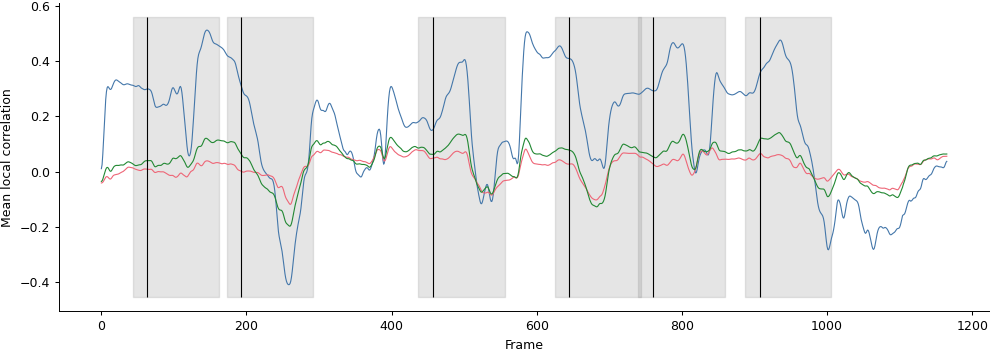

In [101]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(active_calcium_mean_corrs, color="C0")
ax1.plot(inactive_calcium_mean_corrs, color="C1")
ax1.plot(random_px_mean_corrs, color="C2")

ymin, ymax = ax1.get_ylim()
ax1.vlines(pks, ymin, ymax, color="black")
for pk in pks:
    ax1.fill_between(np.arange(pk-20, pk+100), ymin, ymax, color="gray", alpha=0.2)
ax1.set_xlabel("Frame")
ax1.set_ylabel("Mean local correlation")

Try with optimal lag calculated from STA

In [174]:
v_downsampled_ravelled = v_downsampled.reshape(v_downsampled.shape[0], -1).T
ca_downsampled_ravelled = np.roll(ca_downsampled.reshape(ca_downsampled.shape[0], -1).T, ca_lag, axis=1)
# Require odd window size
window_size = 111
ma_kernel = np.ones((1,window_size))/window_size
sum_kernel = np.ones((1,window_size))
v_padded = np.pad(v_downsampled_ravelled, ((0,0),(window_size//2,window_size//2)), mode="reflect")
ca_padded = np.pad(ca_downsampled_ravelled, ((0,0),(window_size//2,window_size//2)), mode="reflect")
v_ma = signal.convolve(v_padded, ma_kernel, mode="valid")
ca_ma = signal.convolve(ca_padded, ma_kernel, mode="valid")

num = signal.convolve(v_padded*ca_padded, sum_kernel, mode="valid") + v_ma*ca_ma*window_size - \
    v_ma*signal.convolve(ca_padded, sum_kernel, mode="valid") - \
    ca_ma*signal.convolve(v_padded, sum_kernel, mode="valid")

v_m_moment2 = (v_ma**2*window_size - 2*signal.convolve(v_padded, sum_kernel, mode="valid")*v_ma + signal.convolve(v_padded**2, sum_kernel, mode="valid"))
ca_m_moment2 = (ca_ma**2*window_size - 2*signal.convolve(ca_padded, sum_kernel, mode="valid")*ca_ma + signal.convolve(ca_padded**2, sum_kernel, mode="valid"))
den = np.sqrt(v_m_moment2*ca_m_moment2)

local_corrs = num/den

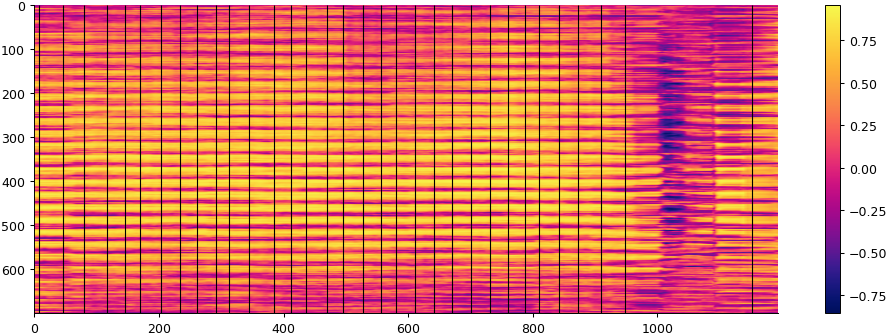

In [175]:
fig1, ax1 = plt.subplots(figsize=(12,4))
has_calcium_activity = np.zeros_like(local_corrs, dtype=bool)
has_calcium_activity[mask_downsampled.ravel(),:] = True
# has_calcium_activity = np.ma.masked_array(has_calcium_activity, ~has_calcium_activity)
q = ax1.imshow(local_corrs[:,:ca_lag], aspect="auto", cmap="cet_CET_L8")
# ax1.imshow(has_calcium_activity, aspect="auto", cmap="gray", alpha=0.5)
ymin, ymax = ax1.get_ylim()
fig1.colorbar(q)
ax1.vlines(pks+ca_lag, ymin, ymax, color="black")

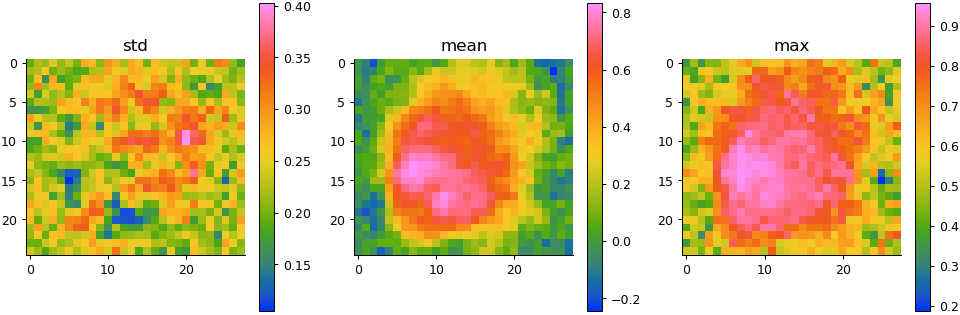

In [176]:
std_corr_img = np.std(local_corrs, axis=1).reshape(v_downsampled.shape[1:])
mean_corr_img = np.mean(local_corrs, axis=1).reshape(v_downsampled.shape[1:])
max_corr_img = np.max(local_corrs, axis=1).reshape(v_downsampled.shape[1:])
fig1, axs = plt.subplots(1,3, figsize=(12,4))
q = axs[0].imshow(std_corr_img)
axs[0].set_title("std")
fig1.colorbar(q, ax=axs[0])
q = axs[1].imshow(mean_corr_img)
axs[1].set_title("mean")
fig1.colorbar(q, ax=axs[1])
q = axs[2].imshow(max_corr_img)
axs[2].set_title("max")
fig1.colorbar(q, ax=axs[2])

In [177]:
active_calcium_mean_corrs = local_corrs[has_calcium_activity[:,0],:].mean(axis=0)
inactive_calcium_mean_corrs = np.nanmean(local_corrs[~has_calcium_activity[:,0],:], axis=0)
random_mask = np.zeros(has_calcium_activity.shape[0], dtype=bool)
random_mask[np.random.choice(np.arange(has_calcium_activity.shape[0]), size=np.sum(has_calcium_activity[:,0]).astype(int), replace=False)] = True
random_px_mean_corrs = local_corrs[random_mask].mean(axis=0)

Text(0, 0.5, 'Mean local correlation')

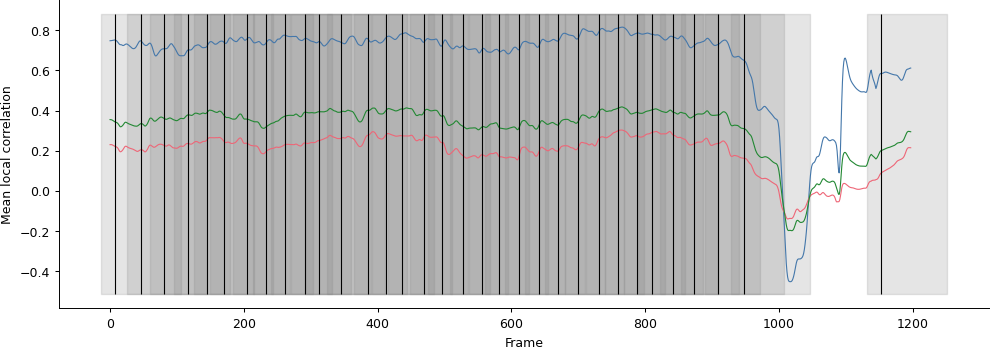

In [178]:
fig1, ax1 = plt.subplots(figsize=(12,4))
ax1.plot(active_calcium_mean_corrs, color="C0")
ax1.plot(inactive_calcium_mean_corrs, color="C1")
ax1.plot(random_px_mean_corrs, color="C2")

ymin, ymax = ax1.get_ylim()
ax1.vlines(pks+ca_lag, ymin, ymax, color="black")
for pk in pks:
    ax1.fill_between(np.arange(pk-20, pk+100)+ca_lag, ymin, ymax, color="gray", alpha=0.2)
ax1.set_xlabel("Frame")
ax1.set_ylabel("Mean local correlation")